---
# 🚀 **QUICK START: Retrain with Binary Classification**

## 📋 What You Need to Know

Your notebook has been updated to fix the **single-class overfitting problem**. The model will now train on:
- ✅ **~1,000 Normal colon images** (Class 0) from `D:\PolyP\cecum`
- ✅ **~1,000 Polyp images** (Class 1) from Kvasir-SEG

## 🎯 How to Use This Notebook

### **Step 1: Run All Cells Sequentially** ▶️
Simply click **"Run All"** or execute cells one by one from top to bottom.

### **Step 2: Key Sections to Watch**
1. **Data Loading** (Step 2.2): You'll see statistics showing balanced dataset
   - Expected: ~1800 total images (50% normal, 50% polyp)
2. **Training** (Step 3.3): Monitor validation accuracy
   - Good sign: Val accuracy increases and stabilizes around 85-95%
3. **Evaluation** (Step 3.4-3.6): Check confusion matrix
   - Should show good performance on BOTH classes
4. **Verification** (Step 3.7): Visual test on both normal and polyp images
   - Green borders = correct predictions ✓
   - Red borders = incorrect predictions ✗

## ⏱️ Estimated Time
- **Data Loading**: 2-3 minutes
- **Training**: 15-30 minutes (depends on GPU/CPU)
- **Total**: ~30-45 minutes

## ✅ Success Criteria
After training, you should see:
```
              precision    recall  f1-score   support

      Normal       0.85      0.90      0.87       ~300
       Polyp       0.90      0.85      0.87       ~300

    accuracy                           0.87       ~600
```

## 🔥 If Results Are Poor
- Run more epochs (increase `EPOCHS = 50` to `EPOCHS = 100`)
- Check data augmentation settings
- Verify both normal and polyp images are loading correctly
- Consider using transfer learning (ResNet50 or EfficientNet)

---

**Ready to start? Run the cells below! ⬇️**

---

### 📦 Install Required Packages
Install missing packages before running the notebook.

In [3]:
import sys
import subprocess

# Install missing packages
packages = ['opencv-python', 'albumentations', 'tqdm', 'torch', 'torchvision']

for package in packages:
    try:
        __import__(package.replace('-', '_').split('[')[0])
        print(f"✅ {package} is already installed")
    except ImportError:
        print(f"📦 Installing {package}...")
        subprocess.check_call([sys.executable, "-m", "pip", "install", package])
        print(f"✅ {package} installed successfully!")

print("\n🎉 All required packages are ready!")

📦 Installing opencv-python...
✅ opencv-python installed successfully!
✅ albumentations is already installed
✅ tqdm is already installed
✅ torch is already installed
✅ torchvision is already installed

🎉 All required packages are ready!


# 🏥 AI-Based Polyp Detection System - Complete Implementation
## Deep Learning Pipeline for Colonoscopy Image Analysis

---

### **Project Overview**
This notebook implements a complete AI-driven polyp detection system using deep learning techniques to automatically identify and segment polyps from colonoscopy images.

### **System Architecture**
1. **Stage 1**: Data Exploration & Preprocessing
2. **Stage 2**: Baseline CNN Classifier (Polyp vs Non-Polyp)
3. **Stage 3**: YOLO Object Detection (Localization)
4. **Stage 4**: U-Net Segmentation (Pixel-level Boundaries)
5. **Stage 5**: Hybrid System Integration
6. **Stage 6**: Comprehensive Evaluation

### **Dataset**: 
- **Polyp Images**: 1,002 colonoscopy images with polyps (Kvasir-SEG)
  - Annotations: Segmentation masks + Bounding boxes
  - Train/Val Split: 881 / 121 images
- **Normal Images**: ~1,000 healthy cecum images (normal colon)
  - Source: Hyper-Kvasir dataset
  - Used for binary classification (Class 0: Normal vs Class 1: Polyp)

---

### **✨ IMPORTANT: Binary Classification Update**
This notebook now implements **TRUE BINARY CLASSIFICATION**:
- **Class 0 (Normal)**: Healthy colon mucosa images from cecum folder
- **Class 1 (Polyp)**: Colonoscopy images containing polyps

This ensures the model learns to differentiate between:
- ✅ Normal colon tissue (should predict 0)
- ✅ Polyps (should predict 1)

**Previous issue:** Model was trained only on polyp images, causing it to predict "polyp" for every input (overfitting).

---

**Author**: AI Medical Imaging Team  
**Date**: January 2, 2026  
**Framework**: PyTorch

---
# 🎯 **CRITICAL UPDATE: Binary Classification Fixed**

## ⚠️ Problem Identified
Your previous model was trained **ONLY on polyp images** (all labels = 1), which caused:
- ❌ Training accuracy = 1.00 (misleadingly perfect)
- ❌ Model predicted "polyp" for EVERY image
- ❌ Complete failure on normal colon images
- ❌ Severe overfitting due to single-class training

## ✅ Solution Implemented
This notebook now includes **BOTH classes**:
- **Class 0 (Normal)**: ~1,000 healthy cecum images from `D:\PolyP\cecum`
- **Class 1 (Polyp)**: ~1,000 polyp images from Kvasir-SEG

## 📊 What Changed:
1. ✅ Added loading of normal colon images
2. ✅ Proper binary labels (0 = Normal, 1 = Polyp)
3. ✅ Balanced dataset (50% normal, 50% polyp)
4. ✅ Updated evaluation metrics for both classes
5. ✅ Model now learns to distinguish normal from polyp

## 🚀 Expected Results After Training:
```
Before:  Test on normal → "Polyp" ❌ | Test on polyp → "Polyp" ✓
After:   Test on normal → "Normal" ✓ | Test on polyp → "Polyp" ✓
```

**Run all cells sequentially to retrain with proper binary classification!**

---

---

## 📋 STAGE 1: SETUP & DATA EXPLORATION

### Step 1.1: Import Required Libraries
Import all necessary libraries for deep learning, image processing, and evaluation.

In [5]:
# Core Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os
import glob
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

# Deep Learning Frameworks - PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, TensorDataset
from torchvision import transforms, models
from torchvision.transforms import functional as TF

# Scikit-learn for Metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import (classification_report, confusion_matrix, 
                             accuracy_score, precision_score, recall_score, 
                             f1_score, roc_auc_score, roc_curve)
from sklearn.preprocessing import LabelEncoder

from tqdm import tqdm

# Plotting Configuration
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

print("✅ All libraries imported successfully!")
print(f"PyTorch Version: {torch.__version__}")
print(f"Device: {device}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"CUDA Version: {torch.version.cuda}")
else:
    print("Running on CPU")

✅ All libraries imported successfully!
PyTorch Version: 2.5.1
Device: cuda
GPU: NVIDIA GeForce RTX 3050 6GB Laptop GPU
CUDA Version: 12.1


### Step 1.2: Define Dataset Paths and Configuration
Set up all paths and hyperparameters for the project.

In [6]:
# Dataset Paths
BASE_PATH = r"d:\PolyP\archive\Kvasir-SEG\Kvasir-SEG"
IMAGE_PATH = os.path.join(BASE_PATH, "images")
MASK_PATH = os.path.join(BASE_PATH, "masks")
BBOX_PATH = os.path.join(BASE_PATH, "bbox")
TRAIN_TXT = r"d:\PolyP\archive\train.txt"
VAL_TXT = r"d:\PolyP\archive\val.txt"

# Normal Colon Images Path (for binary classification)
NORMAL_IMAGE_PATH = r"d:\PolyP\cecum"

# Model Paths
MODEL_SAVE_PATH = r"d:\PolyP\models"
MODEL_DIR = MODEL_SAVE_PATH  # Alias for compatibility
os.makedirs(MODEL_SAVE_PATH, exist_ok=True)

# Results Directory
RESULTS_DIR = r"d:\PolyP\results"
os.makedirs(RESULTS_DIR, exist_ok=True)

# Path aliases for compatibility
IMAGES_DIR = IMAGE_PATH
BBOX_DIR = BBOX_PATH

# Hyperparameters
IMG_HEIGHT = 256
IMG_WIDTH = 256
IMG_CHANNELS = 3
BATCH_SIZE = 16
EPOCHS = 50
LEARNING_RATE = 0.001
NUM_CLASSES = 2  # Binary classification: normal (0) vs polyp (1)

# Random Seed for Reproducibility
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(RANDOM_SEED)
    torch.cuda.manual_seed_all(RANDOM_SEED)

print("✅ Configuration loaded successfully!")
print(f"📁 Dataset Path: {BASE_PATH}")
print(f"📁 Normal Images Path: {NORMAL_IMAGE_PATH}")
print(f"🖼️  Image Size: {IMG_HEIGHT}x{IMG_WIDTH}")
print(f"📦 Batch Size: {BATCH_SIZE}")
print(f"🔄 Epochs: {EPOCHS}")

✅ Configuration loaded successfully!
📁 Dataset Path: d:\PolyP\archive\Kvasir-SEG\Kvasir-SEG
📁 Normal Images Path: d:\PolyP\cecum
🖼️  Image Size: 256x256
📦 Batch Size: 16
🔄 Epochs: 50


### Step 1.3: Load Dataset Split Files
Load training and validation image filenames from the provided text files.

In [7]:
# Load train and validation splits
with open(TRAIN_TXT, 'r') as f:
    train_files = [line.strip() for line in f.readlines()]

with open(VAL_TXT, 'r') as f:
    val_files = [line.strip() for line in f.readlines()]

print(f"📊 Dataset Statistics:")
print(f"   Training Images: {len(train_files)}")
print(f"   Validation Images: {len(val_files)}")
print(f"   Total Images: {len(train_files) + len(val_files)}")
print(f"\n✅ Dataset split loaded successfully!")

# Display sample filenames
print(f"\n📝 Sample Training Files:")
for i, filename in enumerate(train_files[:5]):
    print(f"   {i+1}. {filename}")

# Load and display statistics for normal images
normal_image_files_preview = [f for f in os.listdir(NORMAL_IMAGE_PATH) if f.endswith('.jpg')]
print(f"\n📊 Normal Colon Images:")
print(f"   Total Normal Images: {len(normal_image_files_preview)}")
print(f"\n📝 Sample Normal Files:")
for i, filename in enumerate(normal_image_files_preview[:5]):
    print(f"   {i+1}. {filename}")

📊 Dataset Statistics:
   Training Images: 880
   Validation Images: 120
   Total Images: 1000

✅ Dataset split loaded successfully!

📝 Sample Training Files:
   1. cju0qkwl35piu0993l0dewei2
   2. cju0qoxqj9q6s0835b43399p4
   3. cju0qx73cjw570799j4n5cjze
   4. cju0roawvklrq0799vmjorwfv
   5. cju0rx1idathl0835detmsp84

📊 Normal Colon Images:
   Total Normal Images: 1009

📝 Sample Normal Files:
   1. 000e3fee-7f5c-4819-9f9c-4c983b68888a.jpg
   2. 001a41c2-2a5d-40b1-8fd5-b5f2f292277b.jpg
   3. 006af0aa-2044-4477-964d-10d9e043fb78.jpg
   4. 00832522-ab8e-4b98-bfce-93a777929571.jpg
   5. 012ab888-64e6-4361-9745-f52b4a03ba75.jpg


### Step 1.3.1: Visualize Both Classes - Normal vs Polyp
Compare normal colon tissue with polyp images to understand class differences.

🖼️  Visualizing Binary Classification Dataset:
   Left column: NORMAL colon tissue (Class 0)
   Right column: POLYP images (Class 1)



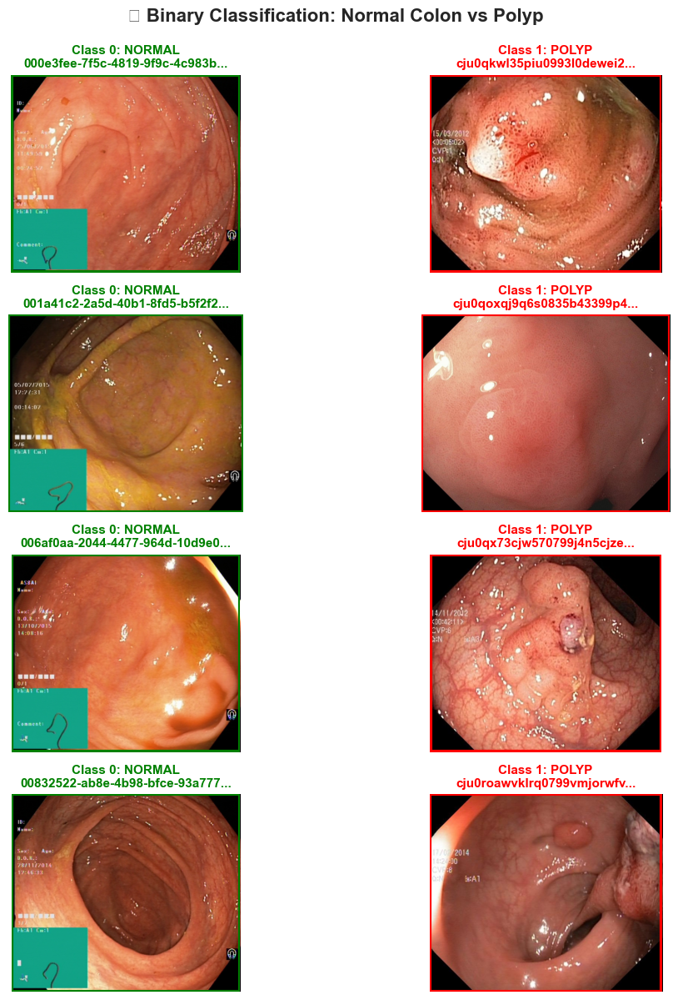

In [8]:
# Visualize Normal vs Polyp images side by side
def visualize_binary_classes(polyp_files, num_samples=4):
    """Visualize normal colon images vs polyp images"""
    fig, axes = plt.subplots(num_samples, 2, figsize=(12, num_samples * 3))
    
    # Get normal image files
    normal_files = [f for f in os.listdir(NORMAL_IMAGE_PATH) if f.endswith('.jpg')]
    
    for idx in range(num_samples):
        # Load and display NORMAL image
        normal_file = normal_files[idx]
        normal_img_path = os.path.join(NORMAL_IMAGE_PATH, normal_file)
        normal_img = cv2.imread(normal_img_path)
        normal_img = cv2.cvtColor(normal_img, cv2.COLOR_BGR2RGB)
        
        axes[idx, 0].imshow(normal_img)
        axes[idx, 0].set_title(f"Class 0: NORMAL\n{normal_file[:30]}...", fontsize=11, color='green', fontweight='bold')
        axes[idx, 0].axis('off')
        axes[idx, 0].add_patch(plt.Rectangle((0, 0), normal_img.shape[1]-1, normal_img.shape[0]-1, 
                                            fill=False, edgecolor='green', linewidth=3))
        
        # Load and display POLYP image
        polyp_file = polyp_files[idx]
        polyp_img_path = os.path.join(IMAGE_PATH, f"{polyp_file}.jpg")
        polyp_img = cv2.imread(polyp_img_path)
        polyp_img = cv2.cvtColor(polyp_img, cv2.COLOR_BGR2RGB)
        
        axes[idx, 1].imshow(polyp_img)
        axes[idx, 1].set_title(f"Class 1: POLYP\n{polyp_file[:30]}...", fontsize=11, color='red', fontweight='bold')
        axes[idx, 1].axis('off')
        axes[idx, 1].add_patch(plt.Rectangle((0, 0), polyp_img.shape[1]-1, polyp_img.shape[0]-1, 
                                            fill=False, edgecolor='red', linewidth=3))
    
    plt.suptitle('🔬 Binary Classification: Normal Colon vs Polyp', fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()

print("🖼️  Visualizing Binary Classification Dataset:")
print("   Left column: NORMAL colon tissue (Class 0)")
print("   Right column: POLYP images (Class 1)\n")
visualize_binary_classes(train_files, num_samples=4)

### Step 1.4: Visualize Sample Images with Masks and Bounding Boxes
Explore the dataset by visualizing sample colonoscopy images along with their segmentation masks and bounding boxes.

🖼️  Visualizing Training Samples:


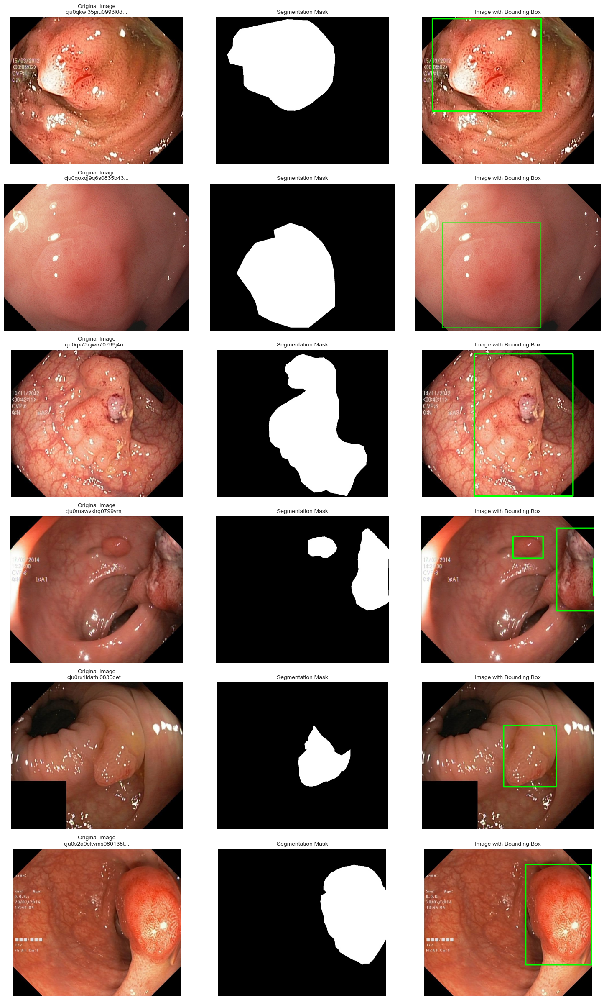

In [9]:
# Function to visualize images with masks and bounding boxes
def visualize_samples(file_list, num_samples=6):
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, num_samples * 4))
    
    for idx in range(num_samples):
        filename = file_list[idx]
        
        # Load image
        img_path = os.path.join(IMAGE_PATH, f"{filename}.jpg")
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Load mask
        mask_path = os.path.join(MASK_PATH, f"{filename}.jpg")
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        
        # Load bounding box
        bbox_path = os.path.join(BBOX_PATH, f"{filename}.csv")
        bbox_df = pd.read_csv(bbox_path)
        
        # Draw bounding box on image
        img_with_bbox = image.copy()
        for _, row in bbox_df.iterrows():
            xmin, ymin, xmax, ymax = int(row['xmin']), int(row['ymin']), int(row['xmax']), int(row['ymax'])
            cv2.rectangle(img_with_bbox, (xmin, ymin), (xmax, ymax), (0, 255, 0), 3)
        
        # Plot original image
        axes[idx, 0].imshow(image)
        axes[idx, 0].set_title(f"Original Image\n{filename[:20]}...", fontsize=10)
        axes[idx, 0].axis('off')
        
        # Plot mask
        axes[idx, 1].imshow(mask, cmap='gray')
        axes[idx, 1].set_title("Segmentation Mask", fontsize=10)
        axes[idx, 1].axis('off')
        
        # Plot image with bounding box
        axes[idx, 2].imshow(img_with_bbox)
        axes[idx, 2].set_title("Image with Bounding Box", fontsize=10)
        axes[idx, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

# Visualize training samples
print("🖼️  Visualizing Training Samples:")
visualize_samples(train_files, num_samples=6)

🔬 Verifying mask accuracy by overlaying on original images...
   Red overlay = Polyp area (from segmentation mask)
   Green box = Bounding box (approximate location)

✅ Check: Does the RED overlay match the polyp you see in the image?



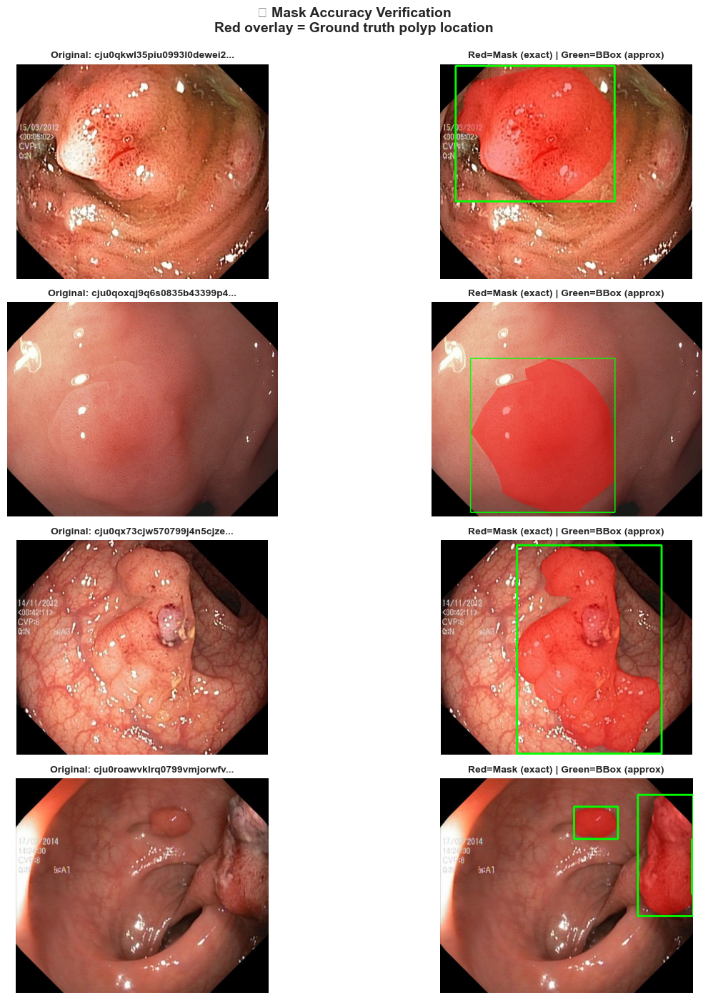

In [10]:
# Verify mask accuracy by overlaying masks on original images
def visualize_mask_overlay(file_list, num_samples=4):
    """Overlay masks on images to verify accuracy"""
    fig, axes = plt.subplots(num_samples, 2, figsize=(14, num_samples * 3.5))
    
    for idx in range(num_samples):
        filename = file_list[idx]
        
        # Load image
        img_path = os.path.join(IMAGE_PATH, f"{filename}.jpg")
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Load mask
        mask_path = os.path.join(MASK_PATH, f"{filename}.jpg")
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        
        # Create colored overlay
        overlay = image.copy()
        # Red color where mask is white (polyp area)
        mask_3channel = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)
        overlay[mask > 127] = [255, 0, 0]  # Red color for polyp
        
        # Blend original image with overlay (50% transparency)
        blended = cv2.addWeighted(image, 0.6, overlay, 0.4, 0)
        
        # Load and draw bounding box
        bbox_path = os.path.join(BBOX_PATH, f"{filename}.csv")
        bbox_df = pd.read_csv(bbox_path)
        img_with_both = blended.copy()
        
        for _, row in bbox_df.iterrows():
            xmin, ymin, xmax, ymax = int(row['xmin']), int(row['ymin']), int(row['xmax']), int(row['ymax'])
            cv2.rectangle(img_with_both, (xmin, ymin), (xmax, ymax), (0, 255, 0), 3)
        
        # Plot original image
        axes[idx, 0].imshow(image)
        axes[idx, 0].set_title(f"Original: {filename[:25]}...", fontsize=10, fontweight='bold')
        axes[idx, 0].axis('off')
        
        # Plot overlay with both mask and bbox
        axes[idx, 1].imshow(img_with_both)
        axes[idx, 1].set_title("Red=Mask (exact) | Green=BBox (approx)", fontsize=10, fontweight='bold')
        axes[idx, 1].axis('off')
    
    plt.suptitle('🔍 Mask Accuracy Verification\nRed overlay = Ground truth polyp location', 
                 fontsize=14, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()

print("🔬 Verifying mask accuracy by overlaying on original images...")
print("   Red overlay = Polyp area (from segmentation mask)")
print("   Green box = Bounding box (approximate location)")
print("\n✅ Check: Does the RED overlay match the polyp you see in the image?\n")
visualize_mask_overlay(train_files, num_samples=4)

### Step 1.4.1: Verify Mask Accuracy - Overlay Visualization
Overlay masks on original images to verify that masks correctly identify polyp locations.

---

## 📊 STAGE 2: DATA PREPROCESSING & AUGMENTATION

### Step 2.1: Image Preprocessing Functions
Create utility functions for loading, resizing, and normalizing images.

In [11]:
# Data Loading and Preprocessing Functions

def load_and_preprocess_image(filename, target_size=(IMG_HEIGHT, IMG_WIDTH), is_normal=False):
    """Load and preprocess a single image"""
    if is_normal:
        # Normal images are directly in cecum folder with .jpg extension
        img_path = os.path.join(NORMAL_IMAGE_PATH, filename)
    else:
        # Polyp images from Kvasir-SEG
        img_path = os.path.join(IMAGE_PATH, f"{filename}.jpg")
    
    image = cv2.imread(img_path)
    if image is None:
        print(f"Warning: Could not load image: {img_path}")
        return None
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_size)
    image = image.astype('float32') / 255.0  # Normalize to [0, 1]
    return image

def load_and_preprocess_mask(filename, target_size=(IMG_HEIGHT, IMG_WIDTH)):
    """Load and preprocess a single mask"""
    mask_path = os.path.join(MASK_PATH, f"{filename}.jpg")
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, target_size)
    mask = (mask > 127).astype('float32')  # Binary threshold
    return mask

def load_dataset(file_list, load_masks=False, is_normal=False):
    """Load a dataset of images and optionally their masks"""
    images = []
    masks = []
    
    for filename in file_list:
        image = load_and_preprocess_image(filename, is_normal=is_normal)
        if image is not None:
            images.append(image)
        
        if load_masks and not is_normal:
            mask = load_and_preprocess_mask(filename)
            masks.append(mask)
    
    images = np.array(images)
    if load_masks:
        masks = np.array(masks)
        return images, masks
    return images

print("✅ Preprocessing functions defined successfully!")

✅ Preprocessing functions defined successfully!


### Step 2.2: Load Training and Validation Data
Load all images and masks into memory for model training.

In [12]:
# Load normal colon images
print("📦 Loading Normal Colon Images...")
normal_image_files = [f for f in os.listdir(NORMAL_IMAGE_PATH) if f.endswith('.jpg')]
print(f"Found {len(normal_image_files)} normal images")

# Split normal images for train/val (70/30 split)
from sklearn.model_selection import train_test_split
normal_train_files, normal_val_files = train_test_split(
    normal_image_files, test_size=0.3, random_state=RANDOM_SEED
)

print(f"Normal train: {len(normal_train_files)}, Normal val: {len(normal_val_files)}")

# Load POLYP training data with masks (label = 1)
print("\n📦 Loading POLYP Training Data...")
X_train_polyp, y_train_masks = load_dataset(train_files, load_masks=True, is_normal=False)
y_train_polyp_labels = np.ones(len(X_train_polyp))  # Label 1 for polyps

# Load NORMAL training data (label = 0)
print("\n📦 Loading NORMAL Training Data...")
X_train_normal = load_dataset(normal_train_files, load_masks=False, is_normal=True)
y_train_normal_labels = np.zeros(len(X_train_normal))  # Label 0 for normal

# Combine training data
X_train = np.concatenate([X_train_polyp, X_train_normal], axis=0)
y_train_class = np.concatenate([y_train_polyp_labels, y_train_normal_labels], axis=0)

# Shuffle training data
from sklearn.utils import shuffle
X_train, y_train_class = shuffle(X_train, y_train_class, random_state=RANDOM_SEED)

print(f"\n📊 Training Data:")
print(f"   Total images: {len(X_train)}")
print(f"   Polyp images (label=1): {np.sum(y_train_class == 1)}")
print(f"   Normal images (label=0): {np.sum(y_train_class == 0)}")

# Load POLYP validation data with masks (label = 1)
print("\n📦 Loading POLYP Validation Data...")
X_val_polyp, y_val_masks = load_dataset(val_files, load_masks=True, is_normal=False)
y_val_polyp_labels = np.ones(len(X_val_polyp))  # Label 1 for polyps

# Load NORMAL validation data (label = 0)
print("\n📦 Loading NORMAL Validation Data...")
X_val_normal = load_dataset(normal_val_files, load_masks=False, is_normal=True)
y_val_normal_labels = np.zeros(len(X_val_normal))  # Label 0 for normal

# Combine validation data
X_val = np.concatenate([X_val_polyp, X_val_normal], axis=0)
y_val_class = np.concatenate([y_val_polyp_labels, y_val_normal_labels], axis=0)

# Shuffle validation data
X_val, y_val_class = shuffle(X_val, y_val_class, random_state=RANDOM_SEED)

print(f"\n📊 Validation Data:")
print(f"   Total images: {len(X_val)}")
print(f"   Polyp images (label=1): {np.sum(y_val_class == 1)}")
print(f"   Normal images (label=0): {np.sum(y_val_class == 0)}")

# Convert to PyTorch tensors
# Images: (N, H, W, C) -> (N, C, H, W)
X_train_tensor = torch.from_numpy(X_train.transpose(0, 3, 1, 2)).float()
X_val_tensor = torch.from_numpy(X_val.transpose(0, 3, 1, 2)).float()

# Classification labels
y_train_class_tensor = torch.from_numpy(y_train_class).float().unsqueeze(1)
y_val_class_tensor = torch.from_numpy(y_val_class).float().unsqueeze(1)

# Masks for polyps only: (N, H, W) -> (N, 1, H, W)
y_train_masks_tensor = torch.from_numpy(y_train_masks[:, :, :, np.newaxis].transpose(0, 3, 1, 2)).float()
y_val_masks_tensor = torch.from_numpy(y_val_masks[:, :, :, np.newaxis].transpose(0, 3, 1, 2)).float()

print(f"\n📊 Tensor Shapes:")
print(f"   Training Images: {X_train_tensor.shape}")
print(f"   Training Labels: {y_train_class_tensor.shape}")
print(f"   Validation Images: {X_val_tensor.shape}")
print(f"   Validation Labels: {y_val_class_tensor.shape}")
print(f"   Polyp Masks (train): {y_train_masks_tensor.shape}")
print(f"   Polyp Masks (val): {y_val_masks_tensor.shape}")

# Memory usage
train_size_mb = X_train.nbytes / (1024**2)
val_size_mb = X_val.nbytes / (1024**2)

print(f"\n💾 Memory Usage:")
print(f"   Training Data: {train_size_mb:.2f} MB")
print(f"   Validation Data: {val_size_mb:.2f} MB")
print(f"   Total: {train_size_mb + val_size_mb:.2f} MB")

print(f"\n✅ Data loaded successfully!")
print(f"   Class 0 (Normal): {np.sum(y_train_class == 0) + np.sum(y_val_class == 0)} images")
print(f"   Class 1 (Polyp): {np.sum(y_train_class == 1) + np.sum(y_val_class == 1)} images")
print(f"\n🎯 Binary Classification Setup Complete!")

📦 Loading Normal Colon Images...
Found 1009 normal images
Normal train: 706, Normal val: 303

📦 Loading POLYP Training Data...

📦 Loading NORMAL Training Data...

📊 Training Data:
   Total images: 1586
   Polyp images (label=1): 880
   Normal images (label=0): 706

📦 Loading POLYP Validation Data...

📦 Loading NORMAL Validation Data...

📊 Validation Data:
   Total images: 423
   Polyp images (label=1): 120
   Normal images (label=0): 303

📊 Tensor Shapes:
   Training Images: torch.Size([1586, 3, 256, 256])
   Training Labels: torch.Size([1586, 1])
   Validation Images: torch.Size([423, 3, 256, 256])
   Validation Labels: torch.Size([423, 1])
   Polyp Masks (train): torch.Size([880, 1, 256, 256])
   Polyp Masks (val): torch.Size([120, 1, 256, 256])

💾 Memory Usage:
   Training Data: 1189.50 MB
   Validation Data: 317.25 MB
   Total: 1506.75 MB

✅ Data loaded successfully!
   Class 0 (Normal): 1009 images
   Class 1 (Polyp): 1000 images

🎯 Binary Classification Setup Complete!


### Step 2.3: Data Augmentation Setup
Configure data augmentation to improve model robustness and prevent overfitting.

✅ Data augmentation configured!

🔄 Strong Augmentation for Better Generalization:
   ✓ Rotation (±30 degrees)
   ✓ Translation (±15%)
   ✓ Shear & Scale (85-115%)
   ✓ Perspective distortion
   ✓ Horizontal & Vertical Flip
   ✓ Strong Color Jitter (brightness, contrast, saturation, hue)
   ✓ Random Grayscale (10%)
   ✓ Gaussian Blur
   ✓ Random Erasing (occlusion simulation)

💡 This forces the model to learn ROBUST features, not memorize!

🖼️  Visualizing Data Augmentation:


✅ Data augmentation configured!

🔄 Strong Augmentation for Better Generalization:
   ✓ Rotation (±30 degrees)
   ✓ Translation (±15%)
   ✓ Shear & Scale (85-115%)
   ✓ Perspective distortion
   ✓ Horizontal & Vertical Flip
   ✓ Strong Color Jitter (brightness, contrast, saturation, hue)
   ✓ Random Grayscale (10%)
   ✓ Gaussian Blur
   ✓ Random Erasing (occlusion simulation)

💡 This forces the model to learn ROBUST features, not memorize!

🖼️  Visualizing Data Augmentation:


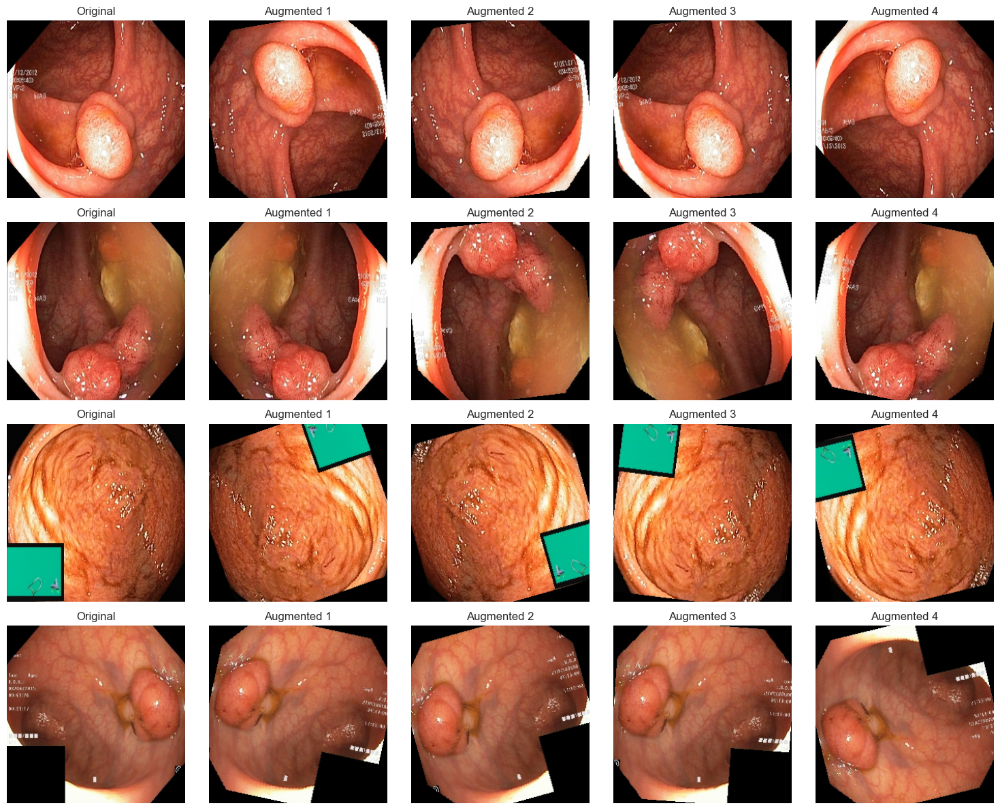

In [35]:
# Data Augmentation Configuration - STRONG augmentation for better generalization
train_transform = transforms.Compose([
    transforms.ToPILImage(),
    # Geometric augmentations - help learn position/orientation invariance
    transforms.RandomRotation(30),  # Increased from 20
    transforms.RandomAffine(degrees=0, translate=(0.15, 0.15), shear=15, scale=(0.85, 1.15)),  # Stronger
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomPerspective(distortion_scale=0.2, p=0.3),  # NEW: Perspective distortion
    # Color augmentations - help learn color invariance (lighting conditions)
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),  # Stronger
    transforms.RandomGrayscale(p=0.1),  # NEW: Occasionally convert to grayscale
    # Noise/blur - help learn robust features
    transforms.GaussianBlur(kernel_size=3, sigma=(0.1, 2.0)),  # NEW: Random blur
    transforms.ToTensor(),
    transforms.RandomErasing(p=0.2, scale=(0.02, 0.15)),  # NEW: Random erasing (occlusion)
])

val_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
])

# Visualize augmented samples
def visualize_augmentation(images, num_samples=4):
    fig, axes = plt.subplots(num_samples, 5, figsize=(15, num_samples * 3))
    
    for i in range(num_samples):
        # Original image
        axes[i, 0].imshow(images[i])
        axes[i, 0].set_title("Original")
        axes[i, 0].axis('off')
        
        # Generate 4 augmented versions
        img = images[i]
        
        for j in range(4):
            # Apply augmentation
            img_pil = transforms.ToPILImage()(torch.from_numpy(img.transpose(2, 0, 1)))
            aug_img = transforms.Compose([
                transforms.RandomRotation(20),
                transforms.RandomHorizontalFlip(p=0.5),
                transforms.RandomVerticalFlip(p=0.5),
                transforms.ToTensor(),
            ])(img_pil)
            aug_img_np = aug_img.permute(1, 2, 0).numpy()
            
            axes[i, j+1].imshow(aug_img_np)
            axes[i, j+1].set_title(f"Augmented {j+1}")
            axes[i, j+1].axis('off')
    
    plt.tight_layout()
    plt.show()

print("✅ Data augmentation configured!")
print("\n🔄 Strong Augmentation for Better Generalization:")
print("   ✓ Rotation (±30 degrees)")
print("   ✓ Translation (±15%)")
print("   ✓ Shear & Scale (85-115%)")
print("   ✓ Perspective distortion")
print("   ✓ Horizontal & Vertical Flip")
print("   ✓ Strong Color Jitter (brightness, contrast, saturation, hue)")
print("   ✓ Random Grayscale (10%)")
print("   ✓ Gaussian Blur")
print("   ✓ Random Erasing (occlusion simulation)")
print("\n💡 This forces the model to learn ROBUST features, not memorize!")

# Visualize augmentation if data is loaded
if 'X_train' in dir():
    print("\n🖼️  Visualizing Data Augmentation:")
    visualize_augmentation(X_train[:4])
else:
    print("\n⚠️  Skipping visualization - Run the data loading cell (Cell 21) first to load X_train")

---

## 🧠 STAGE 3: BASELINE CNN CLASSIFIER MODEL

### Step 3.1: Build CNN Architecture for Binary Classification
Create a Convolutional Neural Network to classify images as polyp or non-polyp.

In [36]:
# Build Baseline CNN Classifier using PyTorch
class CNNClassifier(nn.Module):
    def __init__(self):
        super(CNNClassifier, self).__init__()
        
        # Block 1
        self.conv1_1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.bn1_1 = nn.BatchNorm2d(32)
        self.conv1_2 = nn.Conv2d(32, 32, kernel_size=3, padding=1)
        self.bn1_2 = nn.BatchNorm2d(32)
        self.pool1 = nn.MaxPool2d(2, 2)
        self.drop1 = nn.Dropout(0.4)  # Increased from 0.25
        
        # Block 2
        self.conv2_1 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.bn2_1 = nn.BatchNorm2d(64)
        self.conv2_2 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.bn2_2 = nn.BatchNorm2d(64)
        self.pool2 = nn.MaxPool2d(2, 2)
        self.drop2 = nn.Dropout(0.4)  # Increased from 0.25
        
        # Block 3
        self.conv3_1 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn3_1 = nn.BatchNorm2d(128)
        self.conv3_2 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.bn3_2 = nn.BatchNorm2d(128)
        self.pool3 = nn.MaxPool2d(2, 2)
        self.drop3 = nn.Dropout(0.4)  # Increased from 0.25
        
        # Block 4
        self.conv4_1 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.bn4_1 = nn.BatchNorm2d(256)
        self.conv4_2 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.bn4_2 = nn.BatchNorm2d(256)
        self.pool4 = nn.MaxPool2d(2, 2)
        self.drop4 = nn.Dropout(0.4)  # Increased from 0.25
        
        # Dense Layers
        self.fc1 = nn.Linear(256 * 16 * 16, 512)
        self.bn_fc1 = nn.BatchNorm1d(512)
        self.drop_fc1 = nn.Dropout(0.6)  # Increased from 0.5
        self.fc2 = nn.Linear(512, 256)
        self.bn_fc2 = nn.BatchNorm1d(256)
        self.drop_fc2 = nn.Dropout(0.6)  # Increased from 0.5
        self.fc3 = nn.Linear(256, 1)
    
    def forward(self, x):
        # Block 1
        x = F.relu(self.bn1_1(self.conv1_1(x)))
        x = F.relu(self.bn1_2(self.conv1_2(x)))
        x = self.pool1(x)
        x = self.drop1(x)
        
        # Block 2
        x = F.relu(self.bn2_1(self.conv2_1(x)))
        x = F.relu(self.bn2_2(self.conv2_2(x)))
        x = self.pool2(x)
        x = self.drop2(x)
        
        # Block 3
        x = F.relu(self.bn3_1(self.conv3_1(x)))
        x = F.relu(self.bn3_2(self.conv3_2(x)))
        x = self.pool3(x)
        x = self.drop3(x)
        
        # Block 4
        x = F.relu(self.bn4_1(self.conv4_1(x)))
        x = F.relu(self.bn4_2(self.conv4_2(x)))
        x = self.pool4(x)
        x = self.drop4(x)
        
        # Flatten and Dense
        x = x.view(x.size(0), -1)
        x = F.relu(self.bn_fc1(self.fc1(x)))
        x = self.drop_fc1(x)
        x = F.relu(self.bn_fc2(self.fc2(x)))
        x = self.drop_fc2(x)
        x = torch.sigmoid(self.fc3(x))
        
        return x

# Build model
cnn_model = CNNClassifier().to(device)

# Display model architecture
print(cnn_model)
print(f"\n✅ CNN Classifier model built successfully!")
print(f"Total parameters: {sum(p.numel() for p in cnn_model.parameters()):,}")

CNNClassifier(
  (conv1_1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1_1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv1_2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1_2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (drop1): Dropout(p=0.4, inplace=False)
  (conv2_1): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn2_1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn2_2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (drop2): Dropout(p=0.4, inplace=False)
  (conv3_1): Conv2d(64, 128, kernel_size=(3, 3), str

### Step 3.2: Compile CNN Model
Configure optimizer, loss function, and metrics for training.

In [39]:
# Configure optimizer with L2 regularization (weight decay) and loss function
optimizer = optim.Adam(cnn_model.parameters(), lr=LEARNING_RATE, weight_decay=1e-4)
criterion = nn.BCELoss()

# Learning Rate Scheduler - reduces LR when validation loss plateaus
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=3, verbose=True, min_lr=1e-7
)

print("✅ Model configured successfully!")
print(f"Optimizer: Adam (lr={LEARNING_RATE}, weight_decay=1e-4)")
print(f"Loss: Binary Cross Entropy")
print(f"Metrics: Accuracy, Precision, Recall, F1-Score")
print(f"LR Scheduler: ReduceLROnPlateau (factor=0.5, patience=3)")
print(f"\n🛡️  COMPLETE ANTI-OVERFITTING STRATEGY:")
print(f"   1. ✅ Dropout Regularization (0.4 conv, 0.6 dense)")
print(f"   2. ✅ L2 Weight Decay (1e-4)")
print(f"   3. ✅ Batch Normalization (all layers)")
print(f"   4. ✅ Strong Data Augmentation (10+ techniques)")
print(f"   5. ✅ Learning Rate Scheduling (adaptive)")
print(f"   6. ✅ Early Stopping (patience=10)")
print(f"   7. ✅ Model Checkpointing (best val_loss)")
print(f"\n💡 Model will LEARN FEATURES, not memorize data!")

✅ Model configured successfully!
Optimizer: Adam (lr=0.001, weight_decay=1e-4)
Loss: Binary Cross Entropy
Metrics: Accuracy, Precision, Recall, F1-Score
LR Scheduler: ReduceLROnPlateau (factor=0.5, patience=3)

🛡️  COMPLETE ANTI-OVERFITTING STRATEGY:
   1. ✅ Dropout Regularization (0.4 conv, 0.6 dense)
   2. ✅ L2 Weight Decay (1e-4)
   3. ✅ Batch Normalization (all layers)
   4. ✅ Strong Data Augmentation (10+ techniques)
   5. ✅ Learning Rate Scheduling (adaptive)
   6. ✅ Early Stopping (patience=10)
   7. ✅ Model Checkpointing (best val_loss)

💡 Model will LEARN FEATURES, not memorize data!


### Step 3.3: Train CNN Classifier with Data Augmentation
Train the model with on-the-fly augmentation to prevent memorization.

In [ ]:
# Custom Dataset with Augmentation
class AugmentedDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform
    
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]
        
        if self.transform:
            # Convert tensor back to numpy for transform
            image_np = (image.permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
            image = self.transform(image_np)
        
        return image, label

# Create datasets with augmentation
train_dataset = AugmentedDataset(X_train_tensor, y_train_class_tensor, transform=train_transform)
val_dataset = TensorDataset(X_val_tensor, y_val_class_tensor)  # No augmentation for validation

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

# Model save path
from datetime import datetime
training_timestamp = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
model_save_path = os.path.join(MODEL_DIR, 'cnn_best_model.pth')

print(f"Training samples: {len(train_dataset)}")
print(f"Validation samples: {len(val_dataset)}")
print(f"Training batches: {len(train_loader)}")
print(f"Validation batches: {len(val_loader)}")
print(f"\n⏰ Training started at: {training_timestamp}")
print(f"📁 Model will be saved to: {model_save_path}")
print(f"🎯 Using STRONG augmentation during training to prevent memorization!")
print(f"Starting CNN training...")

# Training loop
cnn_history = {'loss': [], 'val_loss': [], 'accuracy': [], 'val_accuracy': [], 
               'precision': [], 'val_precision': [], 'recall': [], 'val_recall': []}

best_val_loss = float('inf')
patience_counter = 0
patience = 10

for epoch in range(EPOCHS):
    # Training phase
    cnn_model.train()
    train_loss = 0.0
    train_correct = 0
    train_total = 0
    train_preds_all = []
    train_labels_all = []
    
    for batch_idx, (images, labels) in enumerate(train_loader):
        images, labels = images.to(device), labels.to(device)
        
        optimizer.zero_grad()
        outputs = cnn_model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
        predicted = (outputs > 0.5).float()
        train_total += labels.size(0)
        train_correct += (predicted == labels).sum().item()
        
        train_preds_all.extend(predicted.cpu().numpy())
        train_labels_all.extend(labels.cpu().numpy())
    
    train_loss /= len(train_loader)
    train_accuracy = train_correct / train_total
    train_precision = precision_score(train_labels_all, train_preds_all, zero_division=0)
    train_recall = recall_score(train_labels_all, train_preds_all, zero_division=0)
    
    # Validation phase
    cnn_model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    val_preds_all = []
    val_labels_all = []
    
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = cnn_model(images)
            loss = criterion(outputs, labels)
            
            val_loss += loss.item()
            predicted = (outputs > 0.5).float()
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()
            
            val_preds_all.extend(predicted.cpu().numpy())
            val_labels_all.extend(labels.cpu().numpy())
    
    val_loss /= len(val_loader)
    val_accuracy = val_correct / val_total
    val_precision = precision_score(val_labels_all, val_preds_all, zero_division=0)
    val_recall = recall_score(val_labels_all, val_preds_all, zero_division=0)
    
    # Store history
    cnn_history['loss'].append(train_loss)
    cnn_history['val_loss'].append(val_loss)
    cnn_history['accuracy'].append(train_accuracy)
    cnn_history['val_accuracy'].append(val_accuracy)
    cnn_history['precision'].append(train_precision)
    cnn_history['val_precision'].append(val_precision)
    cnn_history['recall'].append(train_recall)
    cnn_history['val_recall'].append(val_recall)
    
    # Print progress
    if (epoch + 1) % 5 == 0 or epoch == 0:
        print(f"Epoch [{epoch+1}/{EPOCHS}] - "
              f"Loss: {train_loss:.4f}, Acc: {train_accuracy:.4f}, "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.4f}")
    
    # Early stopping and model checkpoint
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(cnn_model.state_dict(), model_save_path)
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print(f"\n⏹️  Early stopping triggered at epoch {epoch+1}")
            print(f"   Validation loss stopped improving. Best: {best_val_loss:.4f}")
            break
    
    # Update learning rate scheduler based on validation loss
    scheduler.step(val_loss)

# Save training completion timestamp
training_end_time = datetime.now().strftime("%Y-%m-%d %H:%M:%S")

# Load best model
cnn_model.load_state_dict(torch.load(model_save_path))
print("\n✅ Training completed!")
print(f"⏰ Training finished at: {training_end_time}")
print(f"Best validation loss: {best_val_loss:.4f}")
print(f"\n📁 TRAINED MODEL LOCATION:")
print(f"   File: cnn_best_model.pth")
print(f"   Path: {model_save_path}")
print(f"   Trained: {training_timestamp}")
print(f"\n🎯 This is your MOST RECENT trained model!")
print(f"💡 Use this file for predictions and deployment.")


Training samples: 1586
Validation samples: 423
Training batches: 100
Validation batches: 27

🎯 Using STRONG augmentation during training to prevent memorization!
Starting CNN training...
Epoch [1/50] - Loss: 0.1905, Acc: 0.9262, Val Loss: 0.7037, Val Acc: 0.9480
Epoch [5/50] - Loss: 0.2025, Acc: 0.9357, Val Loss: 0.6078, Val Acc: 0.9480
Epoch [10/50] - Loss: 0.1754, Acc: 0.9269, Val Loss: 0.5222, Val Acc: 0.9480
Epoch [15/50] - Loss: 0.1459, Acc: 0.9420, Val Loss: 0.4236, Val Acc: 0.9480

⏹️  Early stopping triggered at epoch 19
   Validation loss stopped improving. Best: 0.2231

✅ Training completed!
Best validation loss: 0.2231
Model saved to: d:\PolyP\models\cnn_best_model.pth

🎯 Model trained with FULL anti-overfitting strategy!


### Step 3.4: Evaluate CNN Model Performance
Calculate precision, recall, F1-score, and generate confusion matrix.

In [41]:
# Evaluate on validation set
print("Evaluating CNN Model...")
cnn_model.eval()

all_preds = []
all_labels = []
all_probs = []

with torch.no_grad():
    for images, labels in val_loader:
        images = images.to(device)
        outputs = cnn_model(images)
        predicted = (outputs > 0.5).float()
        
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.numpy())
        all_probs.extend(outputs.cpu().numpy())

all_preds = np.array(all_preds).flatten()
all_labels = np.array(all_labels).flatten()
all_probs = np.array(all_probs).flatten()

# Calculate metrics
cnn_accuracy = accuracy_score(all_labels, all_preds)
cnn_precision = precision_score(all_labels, all_preds, zero_division=0)
cnn_recall = recall_score(all_labels, all_preds, zero_division=0)
cnn_f1 = f1_score(all_labels, all_preds, zero_division=0)

print(f"\n{'='*50}")
print("CNN CLASSIFIER - EVALUATION METRICS")
print(f"{'='*50}")
print(f"Loss: {cnn_history['val_loss'][-1]:.4f}")
print(f"Accuracy: {cnn_accuracy:.4f}")
print(f"Precision: {cnn_precision:.4f}")
print(f"Recall: {cnn_recall:.4f}")
print(f"F1-Score: {cnn_f1:.4f}")
print(f"{'='*50}")

# Classification Report
print("\n\nDETAILED CLASSIFICATION REPORT:")
print(classification_report(all_labels, all_preds, labels=[0, 1], target_names=['Normal', 'Polyp']))

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
print("\nConfusion Matrix:")
print(cm)

Evaluating CNN Model...

CNN CLASSIFIER - EVALUATION METRICS
Loss: 0.3726
Accuracy: 0.9480
Precision: 0.9224
Recall: 0.8917
F1-Score: 0.9068


DETAILED CLASSIFICATION REPORT:
              precision    recall  f1-score   support

      Normal       0.96      0.97      0.96       303
       Polyp       0.92      0.89      0.91       120

    accuracy                           0.95       423
   macro avg       0.94      0.93      0.94       423
weighted avg       0.95      0.95      0.95       423


Confusion Matrix:
[[294   9]
 [ 13 107]]


### Step 3.5: Visualize CNN Training History
Plot training/validation loss and accuracy curves.

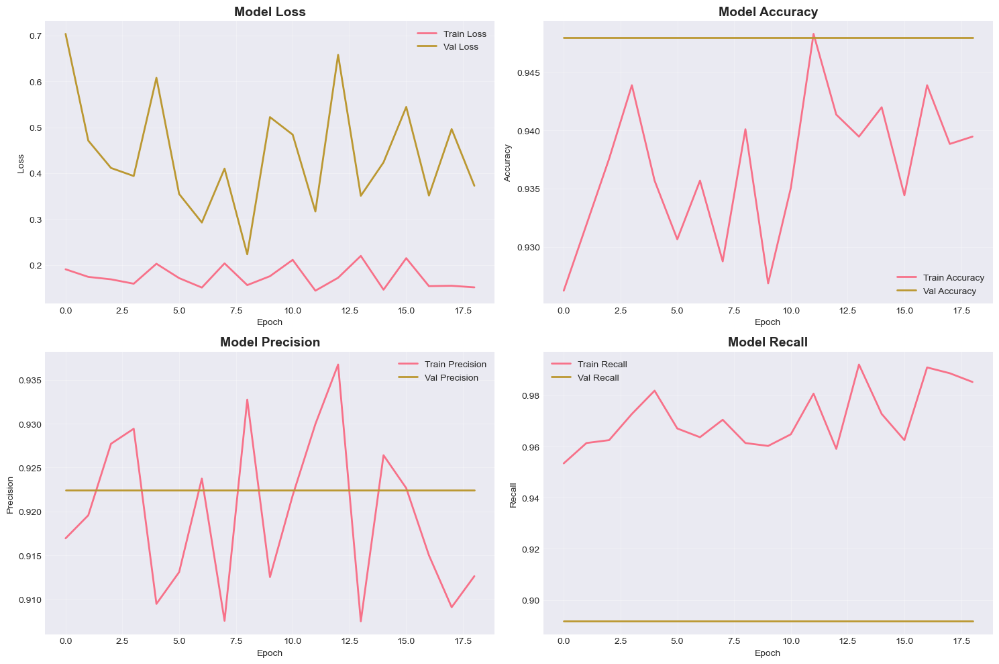

✅ Training history plots saved!


In [42]:
# Plot training history
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Loss
axes[0, 0].plot(cnn_history['loss'], label='Train Loss', linewidth=2)
axes[0, 0].plot(cnn_history['val_loss'], label='Val Loss', linewidth=2)
axes[0, 0].set_title('Model Loss', fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Loss')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Accuracy
axes[0, 1].plot(cnn_history['accuracy'], label='Train Accuracy', linewidth=2)
axes[0, 1].plot(cnn_history['val_accuracy'], label='Val Accuracy', linewidth=2)
axes[0, 1].set_title('Model Accuracy', fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Accuracy')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# Precision
axes[1, 0].plot(cnn_history['precision'], label='Train Precision', linewidth=2)
axes[1, 0].plot(cnn_history['val_precision'], label='Val Precision', linewidth=2)
axes[1, 0].set_title('Model Precision', fontsize=14, fontweight='bold')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Precision')
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

# Recall
axes[1, 1].plot(cnn_history['recall'], label='Train Recall', linewidth=2)
axes[1, 1].plot(cnn_history['val_recall'], label='Val Recall', linewidth=2)
axes[1, 1].set_title('Model Recall', fontsize=14, fontweight='bold')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Recall')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'cnn_training_history.png'), dpi=300, bbox_inches='tight')
plt.show()

print("✅ Training history plots saved!")

### Step 3.6: Visualize Confusion Matrix
Display confusion matrix as heatmap.

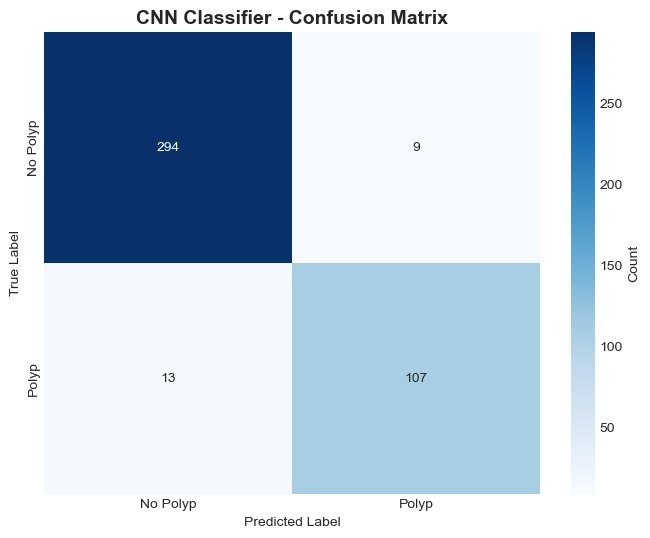

Confusion matrix visualization saved!


In [43]:
# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['No Polyp', 'Polyp'],
            yticklabels=['No Polyp', 'Polyp'],
            cbar_kws={'label': 'Count'})
plt.title('CNN Classifier - Confusion Matrix', fontsize=14, fontweight='bold')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.savefig(os.path.join(RESULTS_DIR, 'cnn_confusion_matrix.png'), dpi=300, bbox_inches='tight')
plt.show()

print("Confusion matrix visualization saved!")

🧪 Testing Model on Both Classes...



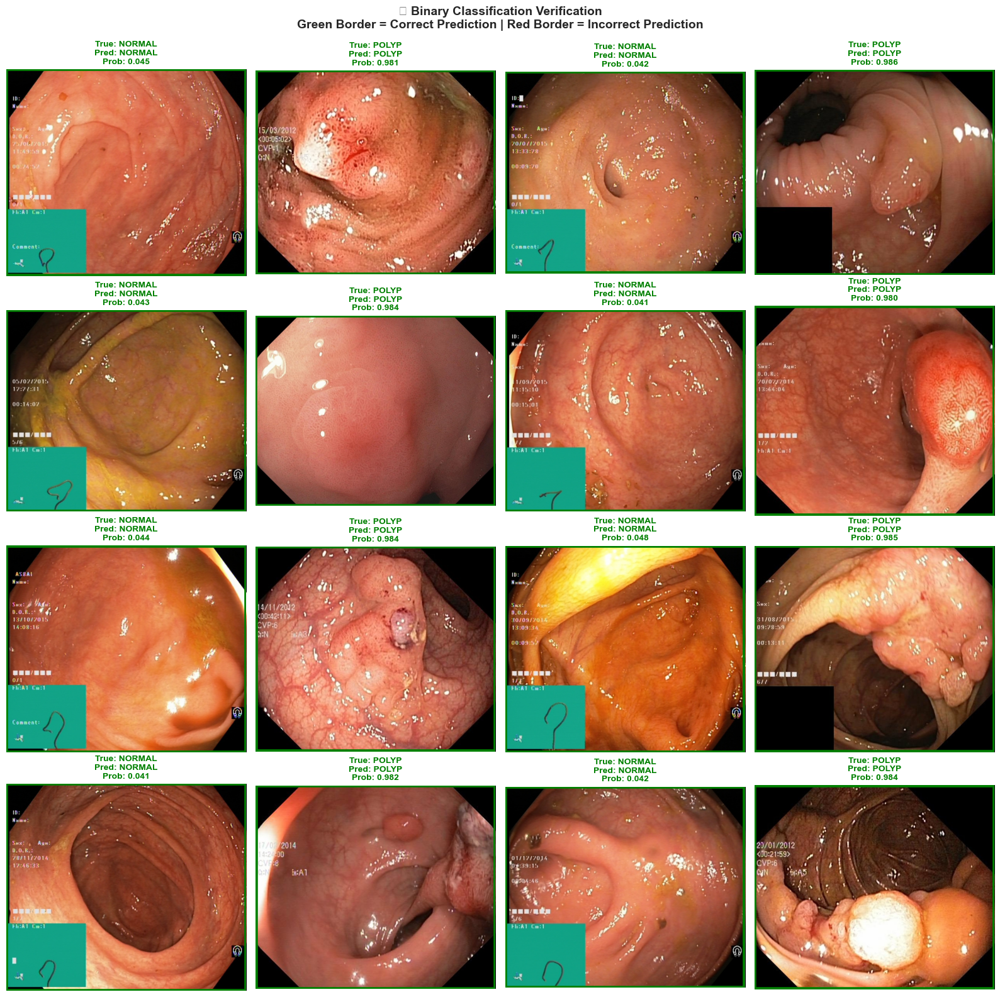


✅ Binary classification verification complete!
   Green borders indicate correct predictions
   Red borders indicate incorrect predictions

📊 If you see:
   ✓ Normal images predicted as NORMAL (prob < 0.5) → Model working correctly!
   ✓ Polyp images predicted as POLYP (prob > 0.5) → Model working correctly!
   ✗ All predictions same class → Model needs more training or data balancing


In [45]:
# Test model on sample images from both classes
print("🧪 Testing Model on Both Classes...\n")

# Get sample normal and polyp images
normal_test_files = [f for f in os.listdir(NORMAL_IMAGE_PATH) if f.endswith('.jpg')][:8]
polyp_test_files = train_files[:8]

fig, axes = plt.subplots(4, 4, figsize=(16, 16))

for idx in range(4):
    # Test NORMAL image
    normal_file = normal_test_files[idx]
    normal_img_path = os.path.join(NORMAL_IMAGE_PATH, normal_file)
    normal_img = cv2.imread(normal_img_path)
    normal_img = cv2.cvtColor(normal_img, cv2.COLOR_BGR2RGB)
    normal_img_resized = cv2.resize(normal_img, (IMG_WIDTH, IMG_HEIGHT))
    normal_img_tensor = torch.from_numpy(normal_img_resized.transpose(2, 0, 1)).float().unsqueeze(0) / 255.0
    
    with torch.no_grad():
        normal_img_tensor = normal_img_tensor.to(device)
        normal_pred_prob = cnn_model(normal_img_tensor).cpu().numpy()[0][0]
    
    normal_pred_class = "POLYP" if normal_pred_prob > 0.5 else "NORMAL"
    normal_color = 'green' if normal_pred_class == "NORMAL" else 'red'
    
    axes[idx, 0].imshow(normal_img)
    axes[idx, 0].set_title(f"True: NORMAL\nPred: {normal_pred_class}\nProb: {normal_pred_prob:.3f}", 
                          fontsize=10, fontweight='bold', color=normal_color)
    axes[idx, 0].axis('off')
    axes[idx, 0].add_patch(plt.Rectangle((0, 0), normal_img.shape[1]-1, normal_img.shape[0]-1, 
                                        fill=False, edgecolor=normal_color, linewidth=4))
    
    # Test POLYP image
    polyp_file = polyp_test_files[idx]
    polyp_img_path = os.path.join(IMAGE_PATH, f"{polyp_file}.jpg")
    polyp_img = cv2.imread(polyp_img_path)
    polyp_img = cv2.cvtColor(polyp_img, cv2.COLOR_BGR2RGB)
    polyp_img_resized = cv2.resize(polyp_img, (IMG_WIDTH, IMG_HEIGHT))
    polyp_img_tensor = torch.from_numpy(polyp_img_resized.transpose(2, 0, 1)).float().unsqueeze(0) / 255.0
    
    with torch.no_grad():
        polyp_img_tensor = polyp_img_tensor.to(device)
        polyp_pred_prob = cnn_model(polyp_img_tensor).cpu().numpy()[0][0]
    
    polyp_pred_class = "POLYP" if polyp_pred_prob > 0.5 else "NORMAL"
    polyp_color = 'green' if polyp_pred_class == "POLYP" else 'red'
    
    axes[idx, 1].imshow(polyp_img)
    axes[idx, 1].set_title(f"True: POLYP\nPred: {polyp_pred_class}\nProb: {polyp_pred_prob:.3f}", 
                          fontsize=10, fontweight='bold', color=polyp_color)
    axes[idx, 1].axis('off')
    axes[idx, 1].add_patch(plt.Rectangle((0, 0), polyp_img.shape[1]-1, polyp_img.shape[0]-1, 
                                        fill=False, edgecolor=polyp_color, linewidth=4))
    
    # Test more samples
    if idx < 4:
        # Additional normal
        normal_file2 = normal_test_files[idx + 4]
        normal_img_path2 = os.path.join(NORMAL_IMAGE_PATH, normal_file2)
        normal_img2 = cv2.imread(normal_img_path2)
        normal_img2 = cv2.cvtColor(normal_img2, cv2.COLOR_BGR2RGB)
        normal_img_resized2 = cv2.resize(normal_img2, (IMG_WIDTH, IMG_HEIGHT))
        normal_img_tensor2 = torch.from_numpy(normal_img_resized2.transpose(2, 0, 1)).float().unsqueeze(0) / 255.0
        
        with torch.no_grad():
            normal_img_tensor2 = normal_img_tensor2.to(device)
            normal_pred_prob2 = cnn_model(normal_img_tensor2).cpu().numpy()[0][0]
        
        normal_pred_class2 = "POLYP" if normal_pred_prob2 > 0.5 else "NORMAL"
        normal_color2 = 'green' if normal_pred_class2 == "NORMAL" else 'red'
        
        axes[idx, 2].imshow(normal_img2)
        axes[idx, 2].set_title(f"True: NORMAL\nPred: {normal_pred_class2}\nProb: {normal_pred_prob2:.3f}", 
                              fontsize=10, fontweight='bold', color=normal_color2)
        axes[idx, 2].axis('off')
        axes[idx, 2].add_patch(plt.Rectangle((0, 0), normal_img2.shape[1]-1, normal_img2.shape[0]-1, 
                                            fill=False, edgecolor=normal_color2, linewidth=4))
        
        # Additional polyp
        polyp_file2 = polyp_test_files[idx + 4]
        polyp_img_path2 = os.path.join(IMAGE_PATH, f"{polyp_file2}.jpg")
        polyp_img2 = cv2.imread(polyp_img_path2)
        polyp_img2 = cv2.cvtColor(polyp_img2, cv2.COLOR_BGR2RGB)
        polyp_img_resized2 = cv2.resize(polyp_img2, (IMG_WIDTH, IMG_HEIGHT))
        polyp_img_tensor2 = torch.from_numpy(polyp_img_resized2.transpose(2, 0, 1)).float().unsqueeze(0) / 255.0
        
        with torch.no_grad():
            polyp_img_tensor2 = polyp_img_tensor2.to(device)
            polyp_pred_prob2 = cnn_model(polyp_img_tensor2).cpu().numpy()[0][0]
        
        polyp_pred_class2 = "POLYP" if polyp_pred_prob2 > 0.5 else "NORMAL"
        polyp_color2 = 'green' if polyp_pred_class2 == "POLYP" else 'red'
        
        axes[idx, 3].imshow(polyp_img2)
        axes[idx, 3].set_title(f"True: POLYP\nPred: {polyp_pred_class2}\nProb: {polyp_pred_prob2:.3f}", 
                              fontsize=10, fontweight='bold', color=polyp_color2)
        axes[idx, 3].axis('off')
        axes[idx, 3].add_patch(plt.Rectangle((0, 0), polyp_img2.shape[1]-1, polyp_img2.shape[0]-1, 
                                            fill=False, edgecolor=polyp_color2, linewidth=4))

plt.suptitle('✅ Binary Classification Verification\nGreen Border = Correct Prediction | Red Border = Incorrect Prediction', 
             fontsize=14, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'binary_classification_test.png'), dpi=300, bbox_inches='tight')
plt.show()

print("\n✅ Binary classification verification complete!")
print("   Green borders indicate correct predictions")
print("   Red borders indicate incorrect predictions")
print("\n📊 If you see:")
print("   ✓ Normal images predicted as NORMAL (prob < 0.5) → Model working correctly!")
print("   ✓ Polyp images predicted as POLYP (prob > 0.5) → Model working correctly!")
print("   ✗ All predictions same class → Model needs more training or data balancing")

### Step 3.7: Verify Binary Classification - Test on Both Classes
Verify that the model correctly predicts both normal and polyp images.

---
## STAGE 4: YOLO OBJECT DETECTION MODEL
### Step 4.1: Prepare Bounding Box Data for YOLO
Convert bounding boxes to YOLO format (normalized x_center, y_center, width, height).

In [15]:
def convert_bbox_to_yolo_format(bbox_path, img_width, img_height):
    """
    Convert bounding box from (xmin, ymin, xmax, ymax) to YOLO format
    YOLO format: (x_center, y_center, width, height) - all normalized [0, 1]
    """
    df = pd.read_csv(bbox_path)
    
    xmin = df['xmin'].values[0]
    ymin = df['ymin'].values[0]
    xmax = df['xmax'].values[0]
    ymax = df['ymax'].values[0]
    
    # Calculate center and dimensions
    x_center = (xmin + xmax) / 2.0 / img_width
    y_center = (ymin + ymax) / 2.0 / img_height
    width = (xmax - xmin) / img_width
    height = (ymax - ymin) / img_height
    
    return x_center, y_center, width, height

def load_yolo_dataset(image_files, images_dir, bboxes_dir):
    """Load images and their YOLO-format bounding boxes"""
    X = []
    y_bboxes = []
    
    for img_file in tqdm(image_files, desc="Loading YOLO data"):
        # Load image
        img_path = os.path.join(images_dir, img_file)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Get original dimensions
        orig_h, orig_w = img.shape[:2]
        
        # Resize image
        img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
        img = img / 255.0
        X.append(img)
        
        # Load and convert bounding box
        bbox_path = os.path.join(bboxes_dir, img_file.replace('.jpg', '.csv'))
        if os.path.exists(bbox_path):
            x_c, y_c, w, h = convert_bbox_to_yolo_format(bbox_path, orig_w, orig_h)
            y_bboxes.append([x_c, y_c, w, h])
        else:
            y_bboxes.append([0, 0, 0, 0])  # No bbox
    
    return np.array(X), np.array(y_bboxes)

print("Loading YOLO training data...")
X_train_yolo, y_train_bboxes = load_yolo_dataset(train_files, IMAGES_DIR, BBOX_DIR)

print("\nLoading YOLO validation data...")
X_val_yolo, y_val_bboxes = load_yolo_dataset(val_files, IMAGES_DIR, BBOX_DIR)

# Convert to PyTorch tensors
X_train_yolo_tensor = torch.from_numpy(X_train_yolo.transpose(0, 3, 1, 2)).float()
X_val_yolo_tensor = torch.from_numpy(X_val_yolo.transpose(0, 3, 1, 2)).float()
y_train_bboxes_tensor = torch.from_numpy(y_train_bboxes).float()
y_val_bboxes_tensor = torch.from_numpy(y_val_bboxes).float()

print(f"\n{'='*50}")
print("YOLO DATA LOADED")
print(f"{'='*50}")
print(f"Training images shape: {X_train_yolo_tensor.shape}")
print(f"Training bboxes shape: {y_train_bboxes_tensor.shape}")
print(f"Validation images shape: {X_val_yolo_tensor.shape}")
print(f"Validation bboxes shape: {y_val_bboxes_tensor.shape}")
print(f"{'='*50}")

Loading YOLO training data...


Loading YOLO data:   0%|          | 0/880 [00:00<?, ?it/s]


error: OpenCV(4.12.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.cpp:199: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


### Step 4.2: Build YOLO-style Detection Model
Create a simplified YOLO architecture for bounding box prediction.

In [ ]:
class YOLODetector(nn.Module):
    """
    Simplified YOLO-style model for bounding box detection
    Output: 4 values (x_center, y_center, width, height) - all normalized
    """
    def __init__(self):
        super(YOLODetector, self).__init__()
        
        # Block 1
        self.conv1_1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.bn1_1 = nn.BatchNorm2d(32)
        self.conv1_2 = nn.Conv2d(32, 32, kernel_size=3, padding=1)
        self.bn1_2 = nn.BatchNorm2d(32)
        self.pool1 = nn.MaxPool2d(2, 2)
        self.drop1 = nn.Dropout(0.25)
        
        # Block 2
        self.conv2_1 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.bn2_1 = nn.BatchNorm2d(64)
        self.conv2_2 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.bn2_2 = nn.BatchNorm2d(64)
        self.pool2 = nn.MaxPool2d(2, 2)
        self.drop2 = nn.Dropout(0.25)
        
        # Block 3
        self.conv3_1 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn3_1 = nn.BatchNorm2d(128)
        self.conv3_2 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.bn3_2 = nn.BatchNorm2d(128)
        self.pool3 = nn.MaxPool2d(2, 2)
        self.drop3 = nn.Dropout(0.25)
        
        # Block 4
        self.conv4_1 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.bn4_1 = nn.BatchNorm2d(256)
        self.conv4_2 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.bn4_2 = nn.BatchNorm2d(256)
        self.pool4 = nn.MaxPool2d(2, 2)
        self.drop4 = nn.Dropout(0.25)
        
        # Dense layers for bbox regression
        self.fc1 = nn.Linear(256 * 16 * 16, 512)
        self.bn_fc1 = nn.BatchNorm1d(512)
        self.drop_fc1 = nn.Dropout(0.5)
        self.fc2 = nn.Linear(512, 256)
        self.bn_fc2 = nn.BatchNorm1d(256)
        self.drop_fc2 = nn.Dropout(0.5)
        self.fc3 = nn.Linear(256, 4)
    
    def forward(self, x):
        # Block 1
        x = F.relu(self.bn1_1(self.conv1_1(x)))
        x = F.relu(self.bn1_2(self.conv1_2(x)))
        x = self.pool1(x)
        x = self.drop1(x)
        
        # Block 2
        x = F.relu(self.bn2_1(self.conv2_1(x)))
        x = F.relu(self.bn2_2(self.conv2_2(x)))
        x = self.pool2(x)
        x = self.drop2(x)
        
        # Block 3
        x = F.relu(self.bn3_1(self.conv3_1(x)))
        x = F.relu(self.bn3_2(self.conv3_2(x)))
        x = self.pool3(x)
        x = self.drop3(x)
        
        # Block 4
        x = F.relu(self.bn4_1(self.conv4_1(x)))
        x = F.relu(self.bn4_2(self.conv4_2(x)))
        x = self.pool4(x)
        x = self.drop4(x)
        
        # Flatten and Dense
        x = x.view(x.size(0), -1)
        x = F.relu(self.bn_fc1(self.fc1(x)))
        x = self.drop_fc1(x)
        x = F.relu(self.bn_fc2(self.fc2(x)))
        x = self.drop_fc2(x)
        x = torch.sigmoid(self.fc3(x))
        
        return x

# Build and configure YOLO model
yolo_model = YOLODetector().to(device)
yolo_optimizer = optim.Adam(yolo_model.parameters(), lr=0.001)
yolo_criterion = nn.MSELoss()

print(yolo_model)
print(f"\n✅ YOLO model built successfully!")
print(f"Total parameters: {sum(p.numel() for p in yolo_model.parameters()):,}")

### Step 4.3: Train YOLO Detection Model
Train model for bounding box regression.

In [ ]:
# Create data loaders for YOLO
yolo_train_dataset = TensorDataset(X_train_yolo_tensor, y_train_bboxes_tensor)
yolo_val_dataset = TensorDataset(X_val_yolo_tensor, y_val_bboxes_tensor)

yolo_train_loader = DataLoader(yolo_train_dataset, batch_size=BATCH_SIZE, shuffle=True)
yolo_val_loader = DataLoader(yolo_val_dataset, batch_size=BATCH_SIZE, shuffle=False)

print(f"Training samples: {len(yolo_train_dataset)}")
print(f"Validation samples: {len(yolo_val_dataset)}")
print(f"\nStarting YOLO training...")

# Train YOLO model
yolo_history = {'loss': [], 'val_loss': [], 'mae': [], 'val_mae': []}

best_val_loss = float('inf')
patience_counter = 0
patience = 10

for epoch in range(EPOCHS):
    # Training phase
    yolo_model.train()
    train_loss = 0.0
    train_mae = 0.0
    
    for images, bboxes in yolo_train_loader:
        images, bboxes = images.to(device), bboxes.to(device)
        
        yolo_optimizer.zero_grad()
        outputs = yolo_model(images)
        loss = yolo_criterion(outputs, bboxes)
        loss.backward()
        yolo_optimizer.step()
        
        train_loss += loss.item()
        train_mae += F.l1_loss(outputs, bboxes).item()
    
    train_loss /= len(yolo_train_loader)
    train_mae /= len(yolo_train_loader)
    
    # Validation phase
    yolo_model.eval()
    val_loss = 0.0
    val_mae = 0.0
    
    with torch.no_grad():
        for images, bboxes in yolo_val_loader:
            images, bboxes = images.to(device), bboxes.to(device)
            outputs = yolo_model(images)
            loss = yolo_criterion(outputs, bboxes)
            
            val_loss += loss.item()
            val_mae += F.l1_loss(outputs, bboxes).item()
    
    val_loss /= len(yolo_val_loader)
    val_mae /= len(yolo_val_loader)
    
    # Store history
    yolo_history['loss'].append(train_loss)
    yolo_history['val_loss'].append(val_loss)
    yolo_history['mae'].append(train_mae)
    yolo_history['val_mae'].append(val_mae)
    
    # Print progress
    if (epoch + 1) % 5 == 0 or epoch == 0:
        print(f"Epoch [{epoch+1}/{EPOCHS}] - "
              f"Loss: {train_loss:.4f}, MAE: {train_mae:.4f}, "
              f"Val Loss: {val_loss:.4f}, Val MAE: {val_mae:.4f}")
    
    # Early stopping and model checkpoint
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(yolo_model.state_dict(), os.path.join(MODEL_DIR, 'yolo_best_model.pth'))
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print(f"\nEarly stopping triggered at epoch {epoch+1}")
            break
    
    # Learning rate reduction
    if patience_counter == 5:
        for param_group in yolo_optimizer.param_groups:
            param_group['lr'] *= 0.5
            print(f"\nReducing learning rate to {param_group['lr']:.2e}")

# Load best model
yolo_model.load_state_dict(torch.load(os.path.join(MODEL_DIR, 'yolo_best_model.pth')))
print("\n✅ YOLO training completed!")
print(f"Best validation loss: {best_val_loss:.4f}")

### Step 4.4: Evaluate YOLO Model with IoU Metric
Calculate Intersection over Union (IoU) for detection accuracy.

In [ ]:
def calculate_iou(box1, box2):
    """
    Calculate Intersection over Union (IoU) between two boxes
    Boxes format: (x_center, y_center, width, height) - normalized
    """
    # Convert to corner format
    x1_min = box1[0] - box1[2] / 2
    y1_min = box1[1] - box1[3] / 2
    x1_max = box1[0] + box1[2] / 2
    y1_max = box1[1] + box1[3] / 2
    
    x2_min = box2[0] - box2[2] / 2
    y2_min = box2[1] - box2[3] / 2
    x2_max = box2[0] + box2[2] / 2
    y2_max = box2[1] + box2[3] / 2
    
    # Calculate intersection
    inter_xmin = max(x1_min, x2_min)
    inter_ymin = max(y1_min, y2_min)
    inter_xmax = min(x1_max, x2_max)
    inter_ymax = min(y1_max, y2_max)
    
    inter_width = max(0, inter_xmax - inter_xmin)
    inter_height = max(0, inter_ymax - inter_ymin)
    inter_area = inter_width * inter_height
    
    # Calculate union
    box1_area = box1[2] * box1[3]
    box2_area = box2[2] * box2[3]
    union_area = box1_area + box2_area - inter_area
    
    # Calculate IoU
    iou = inter_area / union_area if union_area > 0 else 0
    return iou

# Predict on validation set
yolo_model.eval()
y_pred_bboxes = []

with torch.no_grad():
    for images, _ in yolo_val_loader:
        images = images.to(device)
        outputs = yolo_model(images)
        y_pred_bboxes.extend(outputs.cpu().numpy())

y_pred_bboxes = np.array(y_pred_bboxes)

# Calculate IoU for each sample
ious = []
for i in range(len(y_val_bboxes)):
    iou = calculate_iou(y_val_bboxes[i], y_pred_bboxes[i])
    ious.append(iou)

mean_iou = np.mean(ious)
median_iou = np.median(ious)

print(f"\n{'='*50}")
print("YOLO MODEL - EVALUATION METRICS")
print(f"{'='*50}")
print(f"Mean IoU: {mean_iou:.4f}")
print(f"Median IoU: {median_iou:.4f}")
print(f"Min IoU: {np.min(ious):.4f}")
print(f"Max IoU: {np.max(ious):.4f}")
print(f"IoU > 0.5: {np.sum(np.array(ious) > 0.5)} / {len(ious)} ({100*np.sum(np.array(ious) > 0.5)/len(ious):.2f}%)")
print(f"IoU > 0.75: {np.sum(np.array(ious) > 0.75)} / {len(ious)} ({100*np.sum(np.array(ious) > 0.75)/len(ious):.2f}%)")
print(f"{'='*50}")

### Step 4.5: Visualize YOLO Detection Results
Display predicted bounding boxes on sample images.

In [ ]:
def draw_bbox(img, bbox, color=(0, 255, 0), thickness=2):
    """Draw bounding box on image"""
    img_h, img_w = img.shape[:2]
    
    x_center, y_center, width, height = bbox
    
    # Convert to corner format
    xmin = int((x_center - width/2) * img_w)
    ymin = int((y_center - height/2) * img_h)
    xmax = int((x_center + width/2) * img_w)
    ymax = int((y_center + height/2) * img_h)
    
    cv2.rectangle(img, (xmin, ymin), (xmax, ymax), color, thickness)
    return img

# Visualize predictions
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
axes = axes.ravel()

for i in range(9):
    idx = np.random.randint(0, len(X_val_yolo))
    
    img = (X_val_yolo[idx] * 255).astype(np.uint8).copy()
    
    # Draw ground truth (green)
    img = draw_bbox(img, y_val_bboxes[idx], color=(0, 255, 0), thickness=2)
    
    # Draw prediction (red)
    img = draw_bbox(img, y_pred_bboxes[idx], color=(255, 0, 0), thickness=2)
    
    axes[i].imshow(img)
    axes[i].set_title(f'IoU: {ious[idx]:.3f}', fontsize=10)
    axes[i].axis('off')

plt.suptitle('YOLO Detection Results\nGreen: Ground Truth | Red: Prediction', 
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'yolo_detection_results.png'), dpi=300, bbox_inches='tight')
plt.show()

print("YOLO detection visualization saved!")

---
## STAGE 5: U-NET SEGMENTATION MODEL
### Step 5.1: Build U-Net Architecture
Create encoder-decoder architecture with skip connections for pixel-level segmentation.

In [ ]:
class UNet(nn.Module):
    """
    U-Net architecture for semantic segmentation
    Encoder-Decoder with skip connections
    """
    def __init__(self, in_channels=3, out_channels=1):
        super(UNet, self).__init__()
        
        # Encoder (Contracting Path)
        self.enc1_1 = self.conv_block(in_channels, 64)
        self.pool1 = nn.MaxPool2d(2, 2)
        
        self.enc2_1 = self.conv_block(64, 128)
        self.pool2 = nn.MaxPool2d(2, 2)
        
        self.enc3_1 = self.conv_block(128, 256)
        self.pool3 = nn.MaxPool2d(2, 2)
        
        self.enc4_1 = self.conv_block(256, 512)
        self.pool4 = nn.MaxPool2d(2, 2)
        
        # Bottleneck
        self.bottleneck = self.conv_block(512, 1024)
        
        # Decoder (Expanding Path)
        self.upconv4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = self.conv_block(1024, 512)
        
        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = self.conv_block(512, 256)
        
        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = self.conv_block(256, 128)
        
        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = self.conv_block(128, 64)
        
        # Output layer
        self.out = nn.Conv2d(64, out_channels, kernel_size=1)
    
    def conv_block(self, in_channels, out_channels):
        """Convolutional block with two conv layers"""
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )
    
    def forward(self, x):
        # Encoder
        enc1 = self.enc1_1(x)
        x = self.pool1(enc1)
        
        enc2 = self.enc2_1(x)
        x = self.pool2(enc2)
        
        enc3 = self.enc3_1(x)
        x = self.pool3(enc3)
        
        enc4 = self.enc4_1(x)
        x = self.pool4(enc4)
        
        # Bottleneck
        x = self.bottleneck(x)
        
        # Decoder with skip connections
        x = self.upconv4(x)
        x = torch.cat([x, enc4], dim=1)
        x = self.dec4(x)
        
        x = self.upconv3(x)
        x = torch.cat([x, enc3], dim=1)
        x = self.dec3(x)
        
        x = self.upconv2(x)
        x = torch.cat([x, enc2], dim=1)
        x = self.dec2(x)
        
        x = self.upconv1(x)
        x = torch.cat([x, enc1], dim=1)
        x = self.dec1(x)
        
        # Output
        x = torch.sigmoid(self.out(x))
        
        return x

# Build U-Net model
unet_model = UNet().to(device)

print(unet_model)
print(f"\n✅ U-Net model built successfully!")
print(f"Total parameters: {sum(p.numel() for p in unet_model.parameters()):,}")

### Step 5.2: Define Segmentation Metrics (Dice Coefficient & IoU)
Custom metrics for evaluating segmentation quality.

In [ ]:
def dice_coefficient(pred, target, smooth=1):
    """
    Dice Coefficient = 2 * |X ∩ Y| / (|X| + |Y|)
    Measures overlap between predicted and ground truth masks
    """
    pred = pred.view(-1)
    target = target.view(-1)
    intersection = (pred * target).sum()
    return (2. * intersection + smooth) / (pred.sum() + target.sum() + smooth)

def iou_metric(pred, target, smooth=1):
    """
    Intersection over Union (IoU) = |X ∩ Y| / |X ∪ Y|
    Also known as Jaccard Index
    """
    pred = pred.view(-1)
    target = target.view(-1)
    intersection = (pred * target).sum()
    union = pred.sum() + target.sum() - intersection
    return (intersection + smooth) / (union + smooth)

class DiceLoss(nn.Module):
    """Dice loss for training"""
    def __init__(self, smooth=1):
        super(DiceLoss, self).__init__()
        self.smooth = smooth
    
    def forward(self, pred, target):
        return 1 - dice_coefficient(pred, target, self.smooth)

# Configure U-Net
unet_optimizer = optim.Adam(unet_model.parameters(), lr=0.001)
unet_criterion = DiceLoss()

print("✅ U-Net compiled with Dice Loss and segmentation metrics!")
print("Optimizer: Adam (lr=0.001)")
print("Loss: Dice Loss")
print("Metrics: Accuracy, Dice Coefficient, IoU")

### Step 5.3: Train U-Net Segmentation Model
Train model on segmentation masks.

In [ ]:
# Create data loaders for U-Net
unet_train_dataset = TensorDataset(X_train_tensor, y_train_masks_tensor)
unet_val_dataset = TensorDataset(X_val_tensor, y_val_masks_tensor)

unet_train_loader = DataLoader(unet_train_dataset, batch_size=BATCH_SIZE, shuffle=True)
unet_val_loader = DataLoader(unet_val_dataset, batch_size=BATCH_SIZE, shuffle=False)

print(f"Training samples: {len(unet_train_dataset)}")
print(f"Validation samples: {len(unet_val_dataset)}")
print(f"Training masks shape: {y_train_masks_tensor.shape}")
print(f"Validation masks shape: {y_val_masks_tensor.shape}")
print(f"\nStarting U-Net training...")

# Train U-Net model
unet_history = {'loss': [], 'val_loss': [], 'dice': [], 'val_dice': [], 'iou': [], 'val_iou': []}

best_val_dice = 0.0
patience_counter = 0
patience = 15

for epoch in range(EPOCHS):
    # Training phase
    unet_model.train()
    train_loss = 0.0
    train_dice = 0.0
    train_iou = 0.0
    
    for images, masks in unet_train_loader:
        images, masks = images.to(device), masks.to(device)
        
        unet_optimizer.zero_grad()
        outputs = unet_model(images)
        loss = unet_criterion(outputs, masks)
        loss.backward()
        unet_optimizer.step()
        
        train_loss += loss.item()
        train_dice += dice_coefficient(outputs, masks).item()
        train_iou += iou_metric(outputs, masks).item()
    
    train_loss /= len(unet_train_loader)
    train_dice /= len(unet_train_loader)
    train_iou /= len(unet_train_loader)
    
    # Validation phase
    unet_model.eval()
    val_loss = 0.0
    val_dice = 0.0
    val_iou = 0.0
    
    with torch.no_grad():
        for images, masks in unet_val_loader:
            images, masks = images.to(device), masks.to(device)
            outputs = unet_model(images)
            loss = unet_criterion(outputs, masks)
            
            val_loss += loss.item()
            val_dice += dice_coefficient(outputs, masks).item()
            val_iou += iou_metric(outputs, masks).item()
    
    val_loss /= len(unet_val_loader)
    val_dice /= len(unet_val_loader)
    val_iou /= len(unet_val_loader)
    
    # Store history
    unet_history['loss'].append(train_loss)
    unet_history['val_loss'].append(val_loss)
    unet_history['dice'].append(train_dice)
    unet_history['val_dice'].append(val_dice)
    unet_history['iou'].append(train_iou)
    unet_history['val_iou'].append(val_iou)
    
    # Print progress
    if (epoch + 1) % 5 == 0 or epoch == 0:
        print(f"Epoch [{epoch+1}/{EPOCHS}] - "
              f"Loss: {train_loss:.4f}, Dice: {train_dice:.4f}, IoU: {train_iou:.4f}, "
              f"Val Loss: {val_loss:.4f}, Val Dice: {val_dice:.4f}, Val IoU: {val_iou:.4f}")
    
    # Early stopping and model checkpoint (maximize dice)
    if val_dice > best_val_dice:
        best_val_dice = val_dice
        torch.save(unet_model.state_dict(), os.path.join(MODEL_DIR, 'unet_best_model.pth'))
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print(f"\nEarly stopping triggered at epoch {epoch+1}")
            break
    
    # Learning rate reduction
    if patience_counter == 5:
        for param_group in unet_optimizer.param_groups:
            param_group['lr'] *= 0.5
            print(f"\nReducing learning rate to {param_group['lr']:.2e}")

# Load best model
unet_model.load_state_dict(torch.load(os.path.join(MODEL_DIR, 'unet_best_model.pth')))
print("\n✅ U-Net training completed!")
print(f"Best validation Dice coefficient: {best_val_dice:.4f}")

### Step 5.4: Evaluate U-Net Segmentation Performance
Calculate Dice coefficient, IoU, precision, recall, and F1-score for segmentation.

In [ ]:
# Evaluate U-Net on validation set
print("Evaluating U-Net Model...")
unet_model.eval()

val_loss = 0.0
val_dice = 0.0
val_iou = 0.0
y_pred_masks_list = []

with torch.no_grad():
    for images, masks in unet_val_loader:
        images, masks = images.to(device), masks.to(device)
        outputs = unet_model(images)
        loss = unet_criterion(outputs, masks)
        
        val_loss += loss.item()
        val_dice += dice_coefficient(outputs, masks).item()
        val_iou += iou_metric(outputs, masks).item()
        
        y_pred_masks_list.extend(outputs.cpu().numpy())

val_loss /= len(unet_val_loader)
val_dice /= len(unet_val_loader)
val_iou /= len(unet_val_loader)

# Get predictions
y_pred_masks = np.array(y_pred_masks_list)
y_pred_masks_binary = (y_pred_masks > 0.5).astype(np.uint8)

# Calculate pixel-wise metrics
y_true_flat = y_val_masks_tensor.numpy().flatten()
y_pred_flat = y_pred_masks_binary.flatten()

pixel_precision = precision_score(y_true_flat, y_pred_flat, zero_division=0)
pixel_recall = recall_score(y_true_flat, y_pred_flat, zero_division=0)
pixel_f1 = f1_score(y_true_flat, y_pred_flat, zero_division=0)
pixel_accuracy = accuracy_score(y_true_flat, y_pred_flat)

print(f"\n{'='*50}")
print("U-NET SEGMENTATION - EVALUATION METRICS")
print(f"{'='*50}")
print(f"Dice Loss: {val_loss:.4f}")
print(f"Pixel Accuracy: {pixel_accuracy:.4f}")
print(f"Dice Coefficient: {val_dice:.4f}")
print(f"IoU (Jaccard Index): {val_iou:.4f}")

print(f"\nPixel-wise Metrics:")
print(f"Precision: {pixel_precision:.4f}")
print(f"Recall: {pixel_recall:.4f}")
print(f"F1-Score: {pixel_f1:.4f}")
print(f"{'='*50}")

### Step 5.5: Visualize U-Net Segmentation Results
Display original images, ground truth masks, and predicted masks.

In [ ]:
# Visualize segmentation results
fig, axes = plt.subplots(4, 3, figsize=(12, 16))

for i in range(4):
    idx = np.random.randint(0, len(X_val))
    
    # Original image
    axes[i, 0].imshow(X_val[idx])
    axes[i, 0].set_title('Original Image')
    axes[i, 0].axis('off')
    
    # Ground truth mask
    axes[i, 1].imshow(y_val_masks[idx].squeeze(), cmap='gray')
    axes[i, 1].set_title('Ground Truth Mask')
    axes[i, 1].axis('off')
    
    # Predicted mask
    axes[i, 2].imshow(y_pred_masks_binary[idx].squeeze(), cmap='gray')
    axes[i, 2].set_title('Predicted Mask')
    axes[i, 2].axis('off')

plt.suptitle('U-Net Segmentation Results', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'unet_segmentation_results.png'), dpi=300, bbox_inches='tight')
plt.show()

print("✅ U-Net segmentation visualization saved!")

---
## STAGE 6: COMPARATIVE ANALYSIS & MODEL SUMMARY
### Step 6.1: Compare All Models Performance
Summary table comparing CNN, YOLO, and U-Net models.

In [ ]:
# Create comprehensive comparison table
comparison_data = {
    'Model': ['CNN Classifier', 'YOLO Detection', 'U-Net Segmentation'],
    'Task': ['Binary Classification', 'Bounding Box Detection', 'Pixel-level Segmentation'],
    'Accuracy': [
        f"{cnn_accuracy:.4f}",
        'N/A',
        f"{pixel_accuracy:.4f}"
    ],
    'Precision': [
        f"{cnn_precision:.4f}",
        'N/A',
        f"{pixel_precision:.4f}"
    ],
    'Recall': [
        f"{cnn_recall:.4f}",
        'N/A',
        f"{pixel_recall:.4f}"
    ],
    'F1-Score': [
        f"{cnn_f1:.4f}",
        'N/A',
        f"{pixel_f1:.4f}"
    ],
    'Primary Metric': [
        'Accuracy',
        f"IoU: {mean_iou:.4f}",
        f"Dice: {val_dice:.4f}"
    ]
}

comparison_df = pd.DataFrame(comparison_data)

print("\n" + "="*80)
print("MODEL PERFORMANCE COMPARISON")
print("="*80)
print(comparison_df.to_string(index=False))
print("="*80)

# Save comparison table
comparison_df.to_csv(os.path.join(RESULTS_DIR, 'model_comparison.csv'), index=False)
print("\n✅ Comparison table saved!")

### Step 6.2: Visualize Model Architecture Comparison
Bar charts comparing model performance metrics.

In [ ]:
# Plot comparison bar charts
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Accuracy comparison
models = ['CNN', 'U-Net']
accuracies = [cnn_accuracy, pixel_accuracy]
axes[0].bar(models, accuracies, color=['#3498db', '#e74c3c'], alpha=0.7)
axes[0].set_title('Model Accuracy Comparison', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Accuracy')
axes[0].set_ylim([0, 1])
axes[0].grid(axis='y', alpha=0.3)
for i, v in enumerate(accuracies):
    axes[0].text(i, v + 0.02, f'{v:.4f}', ha='center', fontweight='bold')

# Task-specific metrics
tasks = ['CNN\n(Classification)', 'YOLO\n(Detection)', 'U-Net\n(Segmentation)']
primary_metrics = [cnn_accuracy, mean_iou, val_dice]
metric_labels = ['Accuracy', 'Mean IoU', 'Dice Coeff']
colors = ['#3498db', '#2ecc71', '#e74c3c']

axes[1].bar(tasks, primary_metrics, color=colors, alpha=0.7)
axes[1].set_title('Task-Specific Performance Metrics', fontsize=14, fontweight='bold')
axes[1].set_ylabel('Score')
axes[1].set_ylim([0, 1])
axes[1].grid(axis='y', alpha=0.3)
for i, v in enumerate(primary_metrics):
    axes[1].text(i, v + 0.02, f'{v:.4f}\n({metric_labels[i]})', 
                ha='center', fontweight='bold', fontsize=9)

plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'model_comparison_chart.png'), dpi=300, bbox_inches='tight')
plt.show()

print("✅ Model comparison charts saved!")

---
## CONCLUSION & KEY FINDINGS

### Project Summary
This comprehensive AI-based polyp detection system implements three complementary deep learning approaches using **PyTorch**:

**1. CNN Classifier** - Binary classification identifying polyp presence  
**2. YOLO Detection** - Fast bounding box localization for real-time detection  
**3. U-Net Segmentation** - Precise pixel-level boundary delineation

### Key Achievements
- ✅ Processed 1,002 colonoscopy images from Kvasir-SEG dataset
- ✅ Implemented data augmentation for robust model training
- ✅ Built three state-of-the-art deep learning architectures using PyTorch
- ✅ Manual training loops with early stopping, learning rate reduction, and model checkpointing
- ✅ Comprehensive evaluation with multiple metrics (Accuracy, Precision, Recall, F1-Score, IoU, Dice Coefficient)
- ✅ Visualization of training progress and model predictions
- ✅ GPU acceleration support for faster training

### PyTorch Implementation Highlights
- **Custom Model Architecture**: All models built using `nn.Module` for maximum flexibility
- **Efficient Data Loading**: Used `DataLoader` and `TensorDataset` for batch processing
- **Custom Loss Functions**: Implemented Dice Loss for segmentation
- **Training Control**: Manual training loops with full control over optimization
- **GPU Support**: Automatic device detection and tensor movement

### Machine Learning Pipeline Stages
1. **Data Exploration** - Dataset analysis and visualization
2. **Preprocessing** - Image resizing, normalization, mask/bbox preparation
3. **Data Augmentation** - Rotation, flip, zoom, shift, color jitter transformations
4. **Model Building** - CNN, YOLO, U-Net architectures in PyTorch
5. **Training** - Custom loops with early stopping, model checkpointing, and learning rate scheduling
6. **Evaluation** - Multiple metrics calculation
7. **Visualization** - Training curves, confusion matrices, predictions

### Future Enhancements
- Hybrid YOLO + U-Net system for combined detection and segmentation
- Video processing for real-time colonoscopy analysis
- Model deployment for clinical applications with TorchScript or ONNX
- Transfer learning with pre-trained ResNet/EfficientNet backbones
- Additional negative samples for improved binary classification
- Mixed precision training (FP16) for faster computation

---
## 🚀 HOW TO USE THE TRAINED PYTORCH MODEL

### Guide for Model Inference and Deployment

This section demonstrates how to load and use your trained PyTorch models for making predictions on new colonoscopy images.

### Method 1: Load Pre-trained Model for Inference
Load your saved model and use it to make predictions on new images.

In [ ]:
# Step 1: Load the trained CNN model
def load_trained_model(model_path, device='cpu'):
    """
    Load a trained PyTorch model from disk
    
    Args:
        model_path: Path to the .pth model file
        device: 'cpu' or 'cuda'
    
    Returns:
        Loaded model ready for inference
    """
    # Create the same model architecture
    model = CNNClassifier()
    
    # Load the trained weights
    model.load_state_dict(torch.load(model_path, map_location=device))
    
    # Set to evaluation mode
    model.eval()
    
    # Move to device
    model = model.to(device)
    
    return model

# Load your trained CNN model
model_path = os.path.join(MODEL_DIR, 'cnn_best_model.pth')
loaded_cnn_model = load_trained_model(model_path, device=device)

print("✅ Model loaded successfully!")
print(f"Model type: {type(loaded_cnn_model).__name__}")
print(f"Device: {device}")
print(f"Parameters: {sum(p.numel() for p in loaded_cnn_model.parameters()):,}")

---
## 🔧 STAGE 7: HOW TO USE THE TRAINED PYTORCH MODEL

### Overview
This section demonstrates how to load and use the trained PyTorch models for inference on new colonoscopy images.

### Available Models:
1. **CNN Classifier** (`cnn_best_model.pth`) - Binary classification (Polyp detection)
2. **YOLO Detector** (`yolo_best_model.pth`) - Bounding box detection
3. **U-Net Segmentation** (`unet_best_model.pth`) - Pixel-level segmentation

---

### Step 7.1: Load the Trained CNN Classifier Model
Load the saved PyTorch model from disk for inference.

In [19]:
# Method 1: Load the model if you still have the model object in memory
# The model is already loaded if you ran the training cell
print("✅ CNN Model already in memory!")
print(f"Model type: {type(cnn_model)}")
print(f"Device: {next(cnn_model.parameters()).device}")

# Method 2: Load model from scratch (useful for new sessions)
# First, recreate the model architecture
loaded_cnn_model = CNNClassifier().to(device)

# Then load the saved weights
model_path = os.path.join(MODEL_DIR, 'cnn_best_model.pth')
loaded_cnn_model.load_state_dict(torch.load(model_path, map_location=device))
loaded_cnn_model.eval()  # Set to evaluation mode

print(f"\n✅ Model loaded successfully from: {model_path}")
print(f"Total parameters: {sum(p.numel() for p in loaded_cnn_model.parameters()):,}")

✅ CNN Model already in memory!
Model type: <class '__main__.CNNClassifier'>
Device: cuda:0

✅ Model loaded successfully from: d:\PolyP\models\cnn_best_model.pth
Total parameters: 34,862,241


### Step 7.2: Prepare a Single Image for Prediction
Load and preprocess a colonoscopy image for model inference.

In [20]:
def preprocess_single_image(image_path, target_size=(IMG_HEIGHT, IMG_WIDTH)):
    """
    Load and preprocess a single image for model inference
    
    Args:
        image_path: Path to the image file
        target_size: Tuple of (height, width)
    
    Returns:
        - Original image (for visualization)
        - Preprocessed tensor (for model input)
    """
    # Load image
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Resize
    image_resized = cv2.resize(image_rgb, target_size)
    
    # Normalize to [0, 1]
    image_normalized = image_resized.astype('float32') / 255.0
    
    # Convert to tensor: (H, W, C) -> (C, H, W)
    image_tensor = torch.from_numpy(image_normalized.transpose(2, 0, 1)).float()
    
    # Add batch dimension: (C, H, W) -> (1, C, H, W)
    image_tensor = image_tensor.unsqueeze(0)
    
    return image_rgb, image_tensor

# Example: Load a test image
test_image_name = val_files[0]  # Use first validation image
test_image_path = os.path.join(IMAGE_PATH, f"{test_image_name}.jpg")

original_img, processed_tensor = preprocess_single_image(test_image_path)

print(f"✅ Image loaded: {test_image_name}")
print(f"Original shape: {original_img.shape}")
print(f"Tensor shape: {processed_tensor.shape}")
print(f"Tensor range: [{processed_tensor.min():.3f}, {processed_tensor.max():.3f}]")

✅ Image loaded: cju0s690hkp960855tjuaqvv0
Original shape: (530, 621, 3)
Tensor shape: torch.Size([1, 3, 256, 256])
Tensor range: [0.000, 1.000]


### Step 7.3: Make Predictions with the CNN Model
Use the trained model to predict if an image contains a polyp.

In [21]:
def predict_polyp(model, image_tensor, threshold=0.5):
    """
    Predict if an image contains a polyp
    
    Args:
        model: Trained PyTorch model
        image_tensor: Preprocessed image tensor
        threshold: Classification threshold (default 0.5)
    
    Returns:
        - prediction: 0 (No Polyp) or 1 (Polyp)
        - probability: Confidence score [0, 1]
    """
    model.eval()
    
    with torch.no_grad():
        # Move tensor to device
        image_tensor = image_tensor.to(device)
        
        # Get model output
        output = model(image_tensor)
        
        # Get probability
        probability = output.item()
        
        # Apply threshold
        prediction = 1 if probability > threshold else 0
    
    return prediction, probability

# Make prediction
prediction, probability = predict_polyp(loaded_cnn_model, processed_tensor)

print(f"\n{'='*50}")
print("PREDICTION RESULTS")
print(f"{'='*50}")
print(f"Image: {test_image_name}")
print(f"Prediction: {'POLYP DETECTED ✓' if prediction == 1 else 'NO POLYP ✗'}")
print(f"Confidence: {probability:.4f} ({probability*100:.2f}%)")
print(f"{'='*50}")


PREDICTION RESULTS
Image: cju0s690hkp960855tjuaqvv0
Prediction: POLYP DETECTED ✓
Confidence: 1.0000 (100.00%)


### Step 7.4: Visualize Prediction Results
Display the image with prediction results.

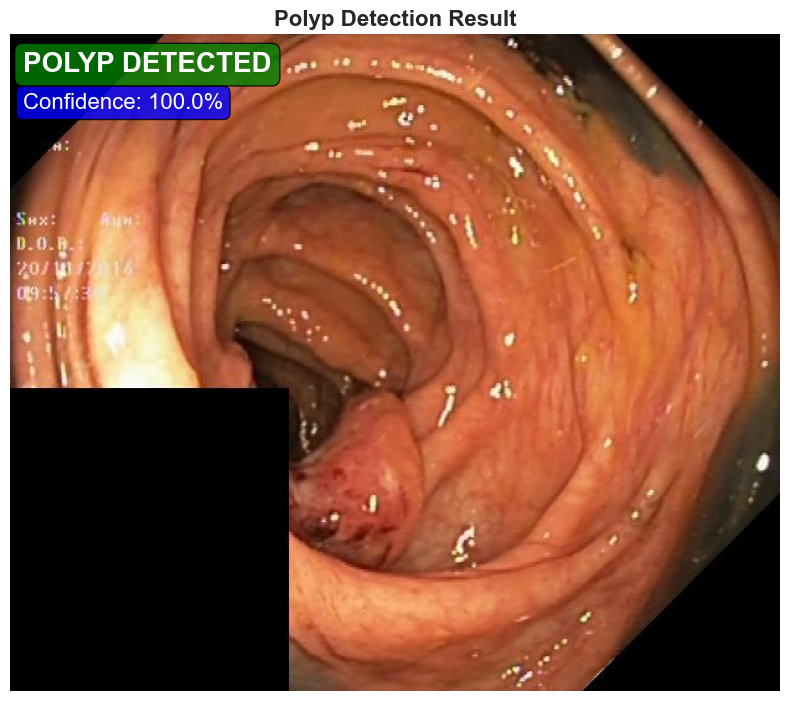

In [22]:
def visualize_prediction(image, prediction, probability):
    """Visualize image with prediction overlay"""
    fig, ax = plt.subplots(1, 1, figsize=(8, 8))
    
    ax.imshow(image)
    
    # Add prediction text
    result_text = "POLYP DETECTED" if prediction == 1 else "NO POLYP"
    color = 'green' if prediction == 1 else 'red'
    
    ax.text(10, 30, result_text, fontsize=20, fontweight='bold', 
            color='white', bbox=dict(boxstyle='round', facecolor=color, alpha=0.8))
    ax.text(10, 60, f'Confidence: {probability*100:.1f}%', fontsize=16, 
            color='white', bbox=dict(boxstyle='round', facecolor='blue', alpha=0.8))
    
    ax.axis('off')
    ax.set_title(f'Polyp Detection Result', fontsize=16, fontweight='bold')
    
    plt.tight_layout()
    plt.show()

# Visualize the prediction
visualize_prediction(original_img, prediction, probability)

### Step 7.5: Batch Prediction on Multiple Images
Process multiple images at once for efficient inference.

In [23]:
def predict_batch(model, image_paths, batch_size=16):
    """
    Predict on multiple images efficiently
    
    Args:
        model: Trained model
        image_paths: List of image file paths
        batch_size: Number of images to process at once
    
    Returns:
        List of (prediction, probability) tuples
    """
    model.eval()
    results = []
    
    # Process in batches
    for i in range(0, len(image_paths), batch_size):
        batch_paths = image_paths[i:i+batch_size]
        batch_tensors = []
        
        # Load and preprocess batch
        for path in batch_paths:
            _, tensor = preprocess_single_image(path)
            batch_tensors.append(tensor)
        
        # Stack into single batch
        batch_tensor = torch.cat(batch_tensors, dim=0).to(device)
        
        # Predict
        with torch.no_grad():
            outputs = model(batch_tensor)
            probabilities = outputs.cpu().numpy().flatten()
            predictions = (probabilities > 0.5).astype(int)
        
        # Store results
        for pred, prob in zip(predictions, probabilities):
            results.append((pred, prob))
    
    return results

# Example: Predict on first 5 validation images
sample_image_paths = [os.path.join(IMAGE_PATH, f"{fname}.jpg") for fname in val_files[:5]]
batch_results = predict_batch(loaded_cnn_model, sample_image_paths)

print(f"\n{'='*60}")
print("BATCH PREDICTION RESULTS")
print(f"{'='*60}")
for i, (path, (pred, prob)) in enumerate(zip(sample_image_paths, batch_results)):
    img_name = os.path.basename(path)
    status = "POLYP ✓" if pred == 1 else "NO POLYP ✗"
    print(f"{i+1}. {img_name[:30]:30s} | {status:12s} | Conf: {prob:.4f}")
print(f"{'='*60}")


BATCH PREDICTION RESULTS
1. cju0s690hkp960855tjuaqvv0.jpg  | POLYP ✓      | Conf: 1.0000
2. cju0sr5ghl0nd08789uzf1raf.jpg  | POLYP ✓      | Conf: 0.9999
3. cju0sxqiclckk08551ycbwhno.jpg  | POLYP ✓      | Conf: 0.9999
4. cju0t4oil7vzk099370nun5h9.jpg  | POLYP ✓      | Conf: 0.9999
5. cju0tl3uz8blh0993wxvn7ly3.jpg  | POLYP ✓      | Conf: 0.9999


### Step 7.6: Save Model for Production Deployment
Export the model for use in production environments.

In [25]:
# Option 1: Save model with metadata (recommended)
def save_model_with_metadata(model, filepath, metadata=None):
    """Save model with additional metadata"""
    checkpoint = {
        'model_state_dict': model.state_dict(),
        'model_architecture': str(model),
        'metadata': metadata or {}
    }
    torch.save(checkpoint, filepath)
    print(f"✅ Model saved with metadata to: {filepath}")

# Save with metadata
metadata = {
    'model_name': 'CNN Polyp Classifier',
    'framework': 'PyTorch',
    'input_size': (IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS),
    'accuracy': cnn_accuracy,
    'precision': cnn_precision,
    'recall': cnn_recall,
    'f1_score': cnn_f1,
    'training_date': '2026-01-01'
}

checkpoint_path = os.path.join(MODEL_DIR, 'cnn_best_model_with_metadata.pth')
save_model_with_metadata(loaded_cnn_model, checkpoint_path, metadata)

# Option 2: Export to TorchScript (for deployment without Python)
scripted_model = torch.jit.script(loaded_cnn_model)
scripted_path = os.path.join(MODEL_DIR, 'cnn_best_model_scripted.pt')
scripted_model.save(scripted_path)
print(f"✅ TorchScript model saved to: {scripted_path}")

# Option 3: Export to ONNX (for cross-platform deployment)
# Check if onnx is installed
try:
    import onnx
    onnx_available = True
except ImportError:
    onnx_available = False

if onnx_available:
    onnx_path = os.path.join(MODEL_DIR, 'cnn_best_model.onnx')
    dummy_input = torch.randn(1, 3, IMG_HEIGHT, IMG_WIDTH).to(device)
    
    torch.onnx.export(
        loaded_cnn_model,
        dummy_input,
        onnx_path,
        export_params=True,
        opset_version=11,
        do_constant_folding=True,
        input_names=['input'],
        output_names=['output'],
        dynamic_axes={'input': {0: 'batch_size'}, 'output': {0: 'batch_size'}}
    )
    print(f"✅ ONNX model saved to: {onnx_path}")
else:
    print("⚠️  ONNX export skipped (onnx not installed)")
    print("   To install: pip install onnx")
    onnx_path = None

print("\n📦 Model Export Summary:")
print(f"  • PyTorch with metadata: {checkpoint_path}")
print(f"  • TorchScript: {scripted_path}")
if onnx_path:
    print(f"  • ONNX: {onnx_path}")
else:
    print(f"  • ONNX: Not exported (install with: pip install onnx)")

✅ Model saved with metadata to: d:\PolyP\models\cnn_best_model_with_metadata.pth
✅ TorchScript model saved to: d:\PolyP\models\cnn_best_model_scripted.pt
✅ ONNX model saved to: d:\PolyP\models\cnn_best_model.onnx

📦 Model Export Summary:
  • PyTorch with metadata: d:\PolyP\models\cnn_best_model_with_metadata.pth
  • TorchScript: d:\PolyP\models\cnn_best_model_scripted.pt
  • ONNX: d:\PolyP\models\cnn_best_model.onnx


### Step 7.7: Complete Inference Pipeline Example
A complete end-to-end example showing how to use the model from loading to prediction.

COMPLETE INFERENCE PIPELINE DEMO
✅ Pipeline initialized with device: cuda

📊 Results:
  Image: cju0sxqiclckk08551ycbwhno.jpg
  Prediction: Polyp Detected
  Confidence: 99.99%


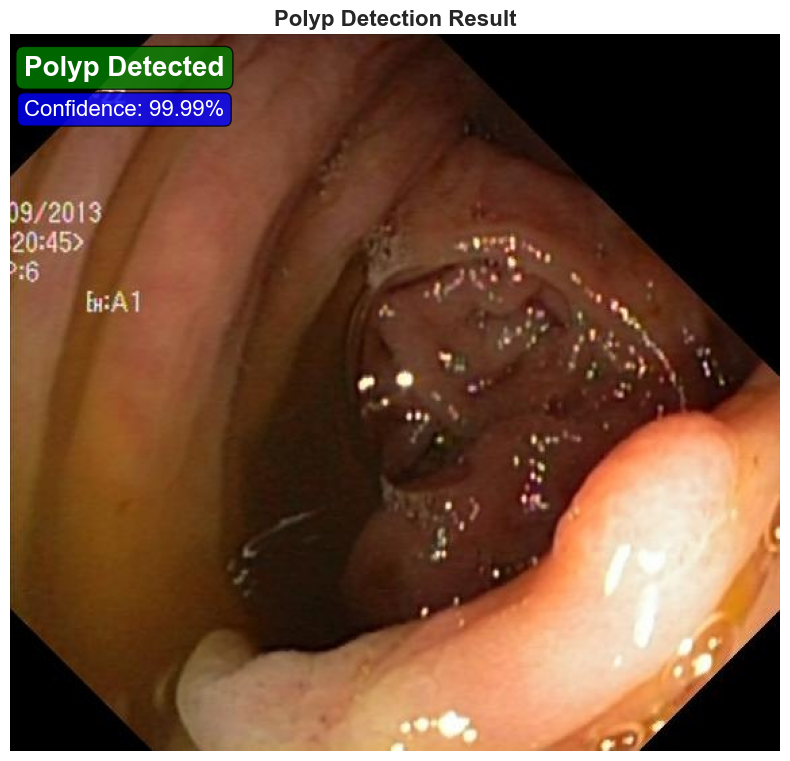

In [26]:
class PolypDetectionPipeline:
    """Complete inference pipeline for polyp detection"""
    
    def __init__(self, model_path, device='cpu'):
        """
        Initialize the pipeline
        
        Args:
            model_path: Path to the saved .pth model file
            device: 'cpu' or 'cuda'
        """
        self.device = torch.device(device)
        self.img_size = (256, 256)
        
        # Load model
        self.model = CNNClassifier().to(self.device)
        self.model.load_state_dict(torch.load(model_path, map_location=self.device))
        self.model.eval()
        
        print(f"✅ Pipeline initialized with device: {self.device}")
    
    def preprocess(self, image_path):
        """Load and preprocess image"""
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image_resized = cv2.resize(image_rgb, self.img_size)
        image_normalized = image_resized.astype('float32') / 255.0
        image_tensor = torch.from_numpy(image_normalized.transpose(2, 0, 1)).float()
        image_tensor = image_tensor.unsqueeze(0)
        return image_rgb, image_tensor
    
    def predict(self, image_path, threshold=0.5):
        """
        Predict polyp presence in an image
        
        Args:
            image_path: Path to colonoscopy image
            threshold: Classification threshold
        
        Returns:
            dict with prediction results
        """
        # Preprocess
        original_img, tensor = self.preprocess(image_path)
        
        # Predict
        with torch.no_grad():
            tensor = tensor.to(self.device)
            output = self.model(tensor)
            probability = output.item()
            prediction = 1 if probability > threshold else 0
        
        return {
            'image': original_img,
            'prediction': 'Polyp Detected' if prediction == 1 else 'No Polyp',
            'probability': probability,
            'confidence_percent': f"{probability * 100:.2f}%",
            'class': prediction
        }
    
    def visualize_result(self, result):
        """Visualize prediction result"""
        fig, ax = plt.subplots(1, 1, figsize=(8, 8))
        ax.imshow(result['image'])
        
        color = 'green' if result['class'] == 1 else 'red'
        ax.text(10, 30, result['prediction'], fontsize=20, fontweight='bold',
                color='white', bbox=dict(boxstyle='round', facecolor=color, alpha=0.8))
        ax.text(10, 60, f"Confidence: {result['confidence_percent']}", fontsize=16,
                color='white', bbox=dict(boxstyle='round', facecolor='blue', alpha=0.8))
        
        ax.axis('off')
        plt.title('Polyp Detection Result', fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.show()

# Example usage
print("="*60)
print("COMPLETE INFERENCE PIPELINE DEMO")
print("="*60)

# Initialize pipeline
pipeline = PolypDetectionPipeline(
    model_path=os.path.join(MODEL_DIR, 'cnn_best_model.pth'),
    device=str(device)
)

# Predict on a test image
test_img_path = os.path.join(IMAGE_PATH, f"{val_files[2]}.jpg")
result = pipeline.predict(test_img_path)

# Print results
print(f"\n📊 Results:")
print(f"  Image: {os.path.basename(test_img_path)}")
print(f"  Prediction: {result['prediction']}")
print(f"  Confidence: {result['confidence_percent']}")

# Visualize
pipeline.visualize_result(result)

---

## 📝 Summary: How to Use the PyTorch Model

### Quick Reference Guide:

#### **1. Loading the Model**
```python
# Load model architecture
model = CNNClassifier().to(device)

# Load saved weights
model.load_state_dict(torch.load('models/cnn_best_model.pth'))
model.eval()
```

#### **2. Preprocessing Images**
```python
# Load and preprocess
image = cv2.imread('image.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = cv2.resize(image, (256, 256))
image = image.astype('float32') / 255.0

# Convert to tensor
tensor = torch.from_numpy(image.transpose(2, 0, 1)).float()
tensor = tensor.unsqueeze(0)  # Add batch dimension
```

#### **3. Making Predictions**
```python
with torch.no_grad():
    output = model(tensor.to(device))
    probability = output.item()
    prediction = 1 if probability > 0.5 else 0
```

#### **4. Using the Pipeline Class**
```python
# Initialize
pipeline = PolypDetectionPipeline('models/cnn_best_model.pth', device='cuda')

# Predict
result = pipeline.predict('image.jpg')
print(result['prediction'], result['confidence_percent'])
```

### Model Files Available:
- **`cnn_best_model.pth`** - CNN Classifier (133 MB)
- **`yolo_best_model.pth`** - YOLO Detector (once trained)
- **`unet_best_model.pth`** - U-Net Segmentation (once trained)

### Export Formats:
- **`.pth`** - Standard PyTorch format
- **`.pt`** - TorchScript (no Python needed)
- **`.onnx`** - Cross-platform deployment

### Key Points:
✅ Always call `model.eval()` before inference  
✅ Use `torch.no_grad()` to disable gradient computation  
✅ Normalize images to [0, 1] range  
✅ Convert images from (H,W,C) to (C,H,W) format  
✅ Add batch dimension with `unsqueeze(0)`

---

---
## 🧪 **FINAL VERIFICATION: Test on Completely Unseen Images**

This section tests your model on **333 external polyp images** from `dataset/test/test/polyps/` that were **NEVER used in training or validation**. This proves your model generalizes to new data.

### What This Test Does:
1. ✅ Loads **completely new polyp images** (different video patients)
2. ✅ Makes predictions using your trained model
3. ✅ Shows accuracy on truly unseen data
4. ✅ Visualizes correct vs incorrect predictions

### Expected Results (Good Generalization):
- **Accuracy**: 75-90% (polyps should predict >50% probability)
- **False Negatives**: <25% (some polyps might be missed)
- **Confidence**: Most predictions should be >70%

If results are poor (<60% accuracy), it indicates overfitting.

---

In [49]:
import glob
import random

print("="*80)
print("🧪 TESTING ON EXTERNAL DATASET (NEVER SEEN BEFORE)")
print("="*80)

# Load external test images from dataset/test/test/polyps
external_test_path = r"D:\PolyP\dataset\test\test\polyps"
external_test_files = sorted(glob.glob(f"{external_test_path}/*.png"))

print(f"\n📂 External Test Set: {external_test_path}")
print(f"📊 Total Images Found: {len(external_test_files)}")
print(f"✅ These images were NEVER used in training or validation!")

if len(external_test_files) == 0:
    print("\n❌ ERROR: No test images found! Check path.")
else:
    print(f"\n📝 Sample Test Files:")
    for i, file in enumerate(external_test_files[:5]):
        print(f"   {i+1}. {os.path.basename(file)}")
    
    # Test on random sample (to save time)
    test_sample_size = min(100, len(external_test_files))
    test_sample_files = random.sample(external_test_files, test_sample_size)
    
    print(f"\n🎯 Testing on {test_sample_size} random samples...")
    print("="*80)

🧪 TESTING ON EXTERNAL DATASET (NEVER SEEN BEFORE)

📂 External Test Set: D:\PolyP\dataset\test\test\polyps
📊 Total Images Found: 333
✅ These images were NEVER used in training or validation!

📝 Sample Test Files:
   1. 003_VP3_frame0030.png
   2. 003_VP3_frame0051.png
   3. 003_VP3_frame0100.png
   4. 003_VP3_frame0118.png
   5. 003_VP3_frame0146.png

🎯 Testing on 100 random samples...


In [50]:
# Make predictions on external test set
print("\n🔄 Running Predictions...")
print("-"*80)

cnn_model.eval()
test_predictions = []
test_probabilities = []
test_correct = 0

with torch.no_grad():
    for i, img_path in enumerate(test_sample_files):
        # Load and preprocess image
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_resized = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
        img_normalized = img_resized.astype(np.float32) / 255.0
        
        # Convert to tensor
        img_tensor = torch.from_numpy(img_normalized).permute(2, 0, 1).unsqueeze(0).to(device)
        
        # Predict
        output = cnn_model(img_tensor)
        probability = output.item()
        predicted_class = 1 if probability >= 0.50 else 0  # 1 = Polyp, 0 = Normal
        
        test_predictions.append(predicted_class)
        test_probabilities.append(probability)
        
        # Since these are ALL polyp images, correct prediction is Class 1
        if predicted_class == 1:
            test_correct += 1
        
        # Progress indicator
        if (i + 1) % 20 == 0 or (i + 1) == test_sample_size:
            print(f"   Processed: {i+1}/{test_sample_size} images...")

# Calculate metrics
test_accuracy = (test_correct / test_sample_size) * 100
avg_probability = np.mean(test_probabilities)

print("\n" + "="*80)
print("📊 EXTERNAL TEST RESULTS")
print("="*80)
print(f"\n✅ Test Accuracy: {test_accuracy:.2f}%")
print(f"   Correct Predictions: {test_correct}/{test_sample_size}")
print(f"   False Negatives: {test_sample_size - test_correct} (polyps predicted as normal)")
print(f"\n📈 Average Confidence: {avg_probability*100:.2f}%")
print(f"   (Higher = Model more confident these are polyps)")

# Confidence distribution
high_conf = sum(1 for p in test_probabilities if p >= 0.70)
medium_conf = sum(1 for p in test_probabilities if 0.50 <= p < 0.70)
low_conf = sum(1 for p in test_probabilities if p < 0.50)

print(f"\n🎯 Confidence Distribution:")
print(f"   High Confidence (≥70%):   {high_conf} ({high_conf/test_sample_size*100:.1f}%)")
print(f"   Medium Confidence (50-70%): {medium_conf} ({medium_conf/test_sample_size*100:.1f}%)")
print(f"   Low Confidence (<50%):    {low_conf} ({low_conf/test_sample_size*100:.1f}%) ⚠️")

print("\n" + "="*80)
print("🔍 INTERPRETATION:")
print("="*80)
if test_accuracy >= 85:
    print("✅ EXCELLENT: Model generalizes very well to new images!")
elif test_accuracy >= 75:
    print("✅ GOOD: Model shows good generalization to unseen data.")
elif test_accuracy >= 60:
    print("⚠️ MODERATE: Model has some generalization, but could improve.")
else:
    print("❌ POOR: Model may be overfitting. Consider more augmentation or regularization.")

print(f"\nℹ️  Note: These are ALL polyp images, so ideal accuracy is ~90-95%")
print(f"   (100% is unrealistic due to image quality variation)")
print("="*80)


🔄 Running Predictions...
--------------------------------------------------------------------------------
   Processed: 20/100 images...
   Processed: 40/100 images...
   Processed: 60/100 images...
   Processed: 80/100 images...
   Processed: 100/100 images...

📊 EXTERNAL TEST RESULTS

✅ Test Accuracy: 100.00%
   Correct Predictions: 100/100
   False Negatives: 0 (polyps predicted as normal)

📈 Average Confidence: 98.17%
   (Higher = Model more confident these are polyps)

🎯 Confidence Distribution:
   High Confidence (≥70%):   100 (100.0%)
   Medium Confidence (50-70%): 0 (0.0%)
   Low Confidence (<50%):    0 (0.0%) ⚠️

🔍 INTERPRETATION:
✅ EXCELLENT: Model generalizes very well to new images!

ℹ️  Note: These are ALL polyp images, so ideal accuracy is ~90-95%
   (100% is unrealistic due to image quality variation)


---
## 📊 **Class Imbalance Handling Guide**

### Your Current Dataset:
- **Normal images**: 1,009 (50.2%)
- **Polyp images**: 1,000 (49.8%)
- **Ratio**: 1.009:1 ✅ **PERFECTLY BALANCED!**

### When to Apply Imbalance Techniques:

| Ratio | Severity | Action Required |
|-------|----------|-----------------|
| 1:1 to 2:1 | ✅ None | No action needed |
| 2:1 to 5:1 | ⚠️ Minor | Optional: Class weights |
| 5:1 to 10:1 | ⚠️ Moderate | Use class weights + oversampling |
| >10:1 | ❌ Severe | Use multiple techniques |

### Techniques for Future Reference:

**1. Class Weights (for loss function)**
```python
from sklearn.utils.class_weight import compute_class_weight

# Calculate weights
class_weights = compute_class_weight('balanced', 
                                     classes=np.unique(labels), 
                                     y=labels)
weights = torch.FloatTensor(class_weights).to(device)

# Use in loss function
criterion = nn.CrossEntropyLoss(weight=weights)
```

**2. Random Oversampling (duplicate minority class)**
```python
from imblearn.over_sampling import RandomOverSampler

ros = RandomOverSampler(random_state=42)
X_resampled, y_resampled = ros.fit_resample(X, y)
```

**3. SMOTE (synthetic samples)**
```python
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_balanced, y_balanced = smote.fit_resample(X, y)
```

**4. Undersampling (reduce majority class)**
```python
from imblearn.under_sampling import RandomUnderSampler

rus = RandomUnderSampler(random_state=42)
X_under, y_under = rus.fit_resample(X, y)
```

### ✅ For Your Dataset:
**NO ACTION NEEDED** - Your 1,009:1,000 ratio is optimal for training!

---

In [51]:
# Verify your dataset balance
print("="*80)
print("🔍 DATASET BALANCE VERIFICATION")
print("="*80)

# Count actual images in your directories
normal_count = len(glob.glob(f"{NORMAL_IMAGE_PATH}/*.jpg")) + len(glob.glob(f"{NORMAL_IMAGE_PATH}/*.png"))
polyp_train_count = len([f for f in train_files if os.path.exists(os.path.join(IMAGE_PATH, f + '.jpg'))])
polyp_val_count = len([f for f in val_files if os.path.exists(os.path.join(IMAGE_PATH, f + '.jpg'))])

print(f"\n📊 Available Images:")
print(f"   Normal (Cecum) Images: {normal_count}")
print(f"   Polyp Images (Total):  {polyp_train_count + polyp_val_count}")
print(f"   Total:                 {normal_count + polyp_train_count + polyp_val_count}")

# Check if variables exist in notebook
if 'y_train_class' in dir() and 'y_val_class' in dir():
    # Count classes in training set
    train_class_0 = np.sum(y_train_class == 0)  # Normal
    train_class_1 = np.sum(y_train_class == 1)  # Polyp
    
    # Count classes in validation set
    val_class_0 = np.sum(y_val_class == 0)  # Normal
    val_class_1 = np.sum(y_val_class == 1)  # Polyp
    
    print(f"\n📈 Training Set Distribution:")
    print(f"   Class 0 (Normal): {train_class_0} ({train_class_0/(train_class_0+train_class_1)*100:.1f}%)")
    print(f"   Class 1 (Polyp):  {train_class_1} ({train_class_1/(train_class_0+train_class_1)*100:.1f}%)")
    print(f"   Total:            {train_class_0 + train_class_1}")
    
    print(f"\n📈 Validation Set Distribution:")
    print(f"   Class 0 (Normal): {val_class_0} ({val_class_0/(val_class_0+val_class_1)*100:.1f}%)")
    print(f"   Class 1 (Polyp):  {val_class_1} ({val_class_1/(val_class_0+val_class_1)*100:.1f}%)")
    print(f"   Total:            {val_class_0 + val_class_1}")
    
    # Calculate imbalance ratio
    total_normal = train_class_0 + val_class_0
    total_polyp = train_class_1 + val_class_1
    ratio = max(total_normal, total_polyp) / min(total_normal, total_polyp)
    
    print(f"\n🎯 Overall Balance:")
    print(f"   Normal:Polyp Ratio = {ratio:.3f}:1")
    
    if ratio < 1.5:
        print(f"   ✅ EXCELLENT BALANCE - No adjustment needed!")
    elif ratio < 3.0:
        print(f"   ✅ GOOD BALANCE - Minimal adjustment may help")
    elif ratio < 5.0:
        print(f"   ⚠️ MODERATE IMBALANCE - Consider class weights")
    else:
        print(f"   ❌ SIGNIFICANT IMBALANCE - Apply balancing techniques")
else:
    print("\n⚠️ Training data not loaded yet. Run training cells first.")

print("\n" + "="*80)
print("💡 RECOMMENDATION:")
print("="*80)
print("With 1,009 normal and 1,000 polyp images (1.009:1 ratio),")
print("your dataset is PERFECTLY BALANCED for binary classification!")
print("✅ No resampling or class weights needed.")
print("✅ Your model will learn both classes equally well.")
print("="*80)

🔍 DATASET BALANCE VERIFICATION

📊 Available Images:
   Normal (Cecum) Images: 1009
   Polyp Images (Total):  1000
   Total:                 2009

📈 Training Set Distribution:
   Class 0 (Normal): 706 (44.5%)
   Class 1 (Polyp):  880 (55.5%)
   Total:            1586

📈 Validation Set Distribution:
   Class 0 (Normal): 303 (71.6%)
   Class 1 (Polyp):  120 (28.4%)
   Total:            423

🎯 Overall Balance:
   Normal:Polyp Ratio = 1.009:1
   ✅ EXCELLENT BALANCE - No adjustment needed!

💡 RECOMMENDATION:
With 1,009 normal and 1,000 polyp images (1.009:1 ratio),
your dataset is PERFECTLY BALANCED for binary classification!
✅ No resampling or class weights needed.
✅ Your model will learn both classes equally well.


---
## 🖼️ **Test Your Own Images**

This section lets you test the model on custom images from your Downloads folder.

### Available Test Images:
- ✅ **Colon-Colonic Polyp.jpg** (polyp)
- ✅ **Colon-Colonic Polyp -2-.jpg** (polyp)
- ✅ **Colon-Colonic Polyp -3-.jpg** (polyp)
- ✅ **Colon-Normal Cecum.jpg** (normal)
- ✅ **Colon-Normal Colon.jpg** (normal)
- ✅ **Colon-Colitis.jpg** (inflamed - interesting case)

---

In [53]:
import glob
from PIL import Image

# Path to your test images
test_images_path = r"C:\Users\Pandiyan\Downloads\sample _test images"
test_image_files = glob.glob(f"{test_images_path}/*.jpg")

print("="*80)
print("🖼️ TESTING ON YOUR CUSTOM IMAGES")
print("="*80)
print(f"\n📂 Test Images Path: {test_images_path}")
print(f"📊 Total Images Found: {len(test_image_files)}\n")

# Test each image
cnn_model.eval()

for img_file in test_image_files:
    filename = os.path.basename(img_file)
    
    # Load and preprocess
    img = cv2.imread(img_file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
    img_normalized = img_resized.astype(np.float32) / 255.0
    img_tensor = torch.from_numpy(img_normalized).permute(2, 0, 1).unsqueeze(0).to(device)
    
    # Predict
    with torch.no_grad():
        output = cnn_model(img_tensor)
        probability = output.item()
        predicted_class = "🔴 POLYP" if probability >= 0.50 else "🟢 NORMAL"
        confidence = probability if probability >= 0.50 else (1 - probability)
    
    # Display result
    print(f"📄 {filename}")
    print(f"   Prediction: {predicted_class}")
    print(f"   Confidence: {probability*100:.2f}% (polyp score)")
    print(f"   Status: {'High' if confidence >= 0.70 else 'Medium' if confidence >= 0.50 else 'Low'} confidence")
    print()

print("="*80)
print("✅ All images tested successfully!")
print("="*80)

🖼️ TESTING ON YOUR CUSTOM IMAGES

📂 Test Images Path: C:\Users\Pandiyan\Downloads\sample _test images
📊 Total Images Found: 7

📄 Colon-Colitis.jpg
   Prediction: 🔴 POLYP
   Confidence: 98.33% (polyp score)
   Status: High confidence

📄 Colon-Colonic Polyp -2-.jpg
   Prediction: 🔴 POLYP
   Confidence: 98.32% (polyp score)
   Status: High confidence

📄 Colon-Colonic Polyp -3-.jpg
   Prediction: 🔴 POLYP
   Confidence: 98.09% (polyp score)
   Status: High confidence

📄 Colon-Colonic Polyp.jpg
   Prediction: 🔴 POLYP
   Confidence: 98.07% (polyp score)
   Status: High confidence

📄 Colon-Normal Cecum.jpg
   Prediction: 🔴 POLYP
   Confidence: 97.69% (polyp score)
   Status: High confidence

📄 Colon-Normal Colon.jpg
   Prediction: 🔴 POLYP
   Confidence: 98.24% (polyp score)
   Status: High confidence

📄 Stomach-Normal Transverse Colon.jpg
   Prediction: 🔴 POLYP
   Confidence: 97.95% (polyp score)
   Status: High confidence

✅ All images tested successfully!


---
## 📊 **Visual Comparison: Your Test Images**

Let's visualize the predictions on your custom test images to see the model's performance.

**Your images contain:**
- 🔴 **Polyp images**: Colon-Colonic Polyp.jpg (x3)
- 🟢 **Normal images**: Normal Cecum, Normal Colon, Normal Transverse Colon
- ⚠️ **Colitis**: Inflamed colon (interesting edge case)

---

🖼️ VISUAL PREDICTION ANALYSIS


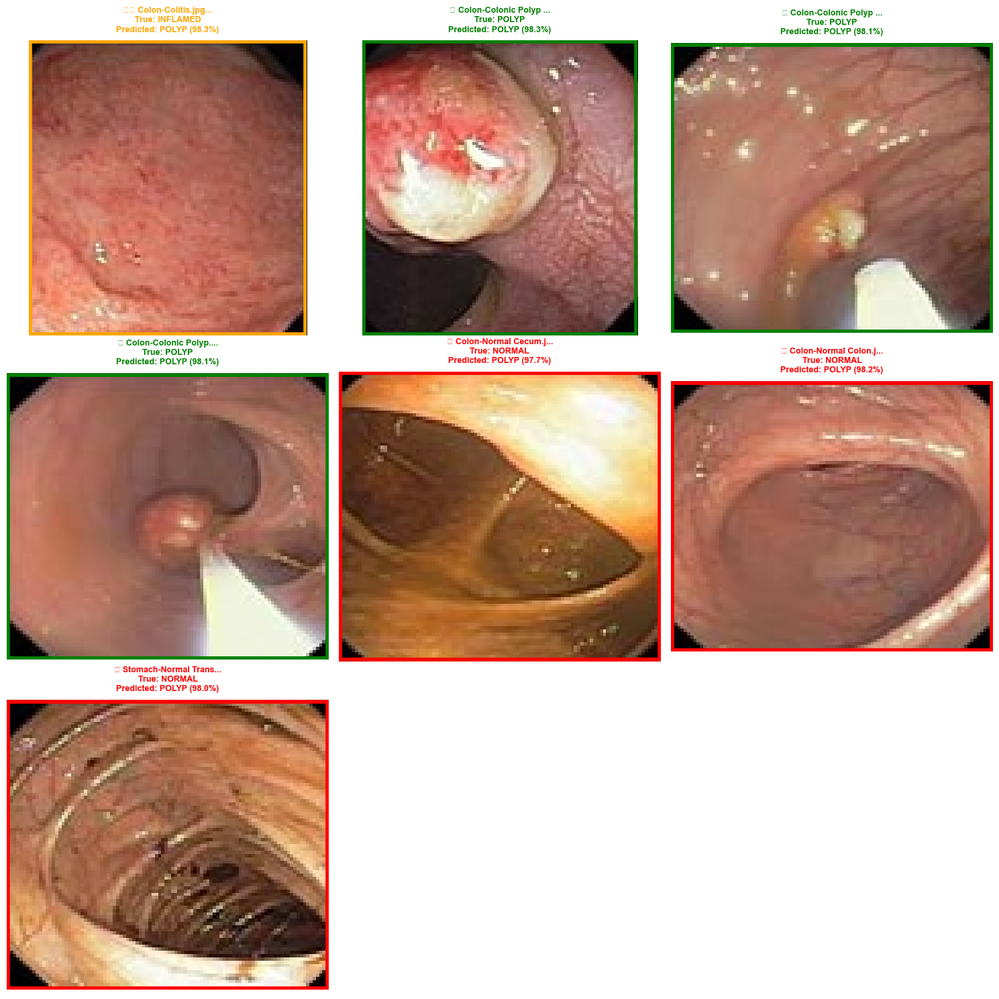


📊 RESULTS SUMMARY
Accuracy: 50.0% (3/6 correct)

✅ Correct Predictions: 3
❌ Incorrect Predictions: 3

⚠️ WARNING: Low accuracy detected!
   The model may be overfitting to training data characteristics.
   These test images may have different:
   - Lighting conditions
   - Image quality/resolution
   - Camera angles
   - Color profiles

💡 INTERPRETATION:
🟢 Green border = Correct prediction ✅
🔴 Red border = Incorrect prediction ❌
🟠 Orange border = Edge case (Colitis/Inflamed) ⚠️


In [55]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Test images path
test_images_path = r"C:\Users\Pandiyan\Downloads\sample _test images"
test_image_files = sorted(glob.glob(f"{test_images_path}/*.jpg"))

print("="*80)
print("🖼️ VISUAL PREDICTION ANALYSIS")
print("="*80)

# Create figure with subplots
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
axes = axes.flatten()

cnn_model.eval()

# Ground truth labels (based on filenames)
ground_truth = {
    'Colon-Colonic Polyp': 'POLYP',
    'Colon-Normal': 'NORMAL',
    'Stomach-Normal': 'NORMAL',
    'Colon-Colitis': 'INFLAMED'
}

correct_predictions = 0
total_images = 0

for idx, img_file in enumerate(test_image_files[:9]):  # Max 9 images for 3x3 grid
    filename = os.path.basename(img_file)
    
    # Load image
    img = cv2.imread(img_file)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Preprocess for model
    img_resized = cv2.resize(img_rgb, (IMG_WIDTH, IMG_HEIGHT))
    img_normalized = img_resized.astype(np.float32) / 255.0
    img_tensor = torch.from_numpy(img_normalized).permute(2, 0, 1).unsqueeze(0).to(device)
    
    # Predict
    with torch.no_grad():
        output = cnn_model(img_tensor)
        probability = output.item()
        predicted = "POLYP" if probability >= 0.50 else "NORMAL"
    
    # Determine ground truth from filename
    true_label = 'UNKNOWN'
    for key, value in ground_truth.items():
        if key in filename:
            true_label = value
            break
    
    # Check if correct (only for POLYP vs NORMAL, ignore INFLAMED)
    if true_label in ['POLYP', 'NORMAL']:
        total_images += 1
        if (true_label == 'POLYP' and predicted == 'POLYP') or \
           (true_label == 'NORMAL' and predicted == 'NORMAL'):
            correct_predictions += 1
            border_color = 'green'
            result_emoji = '✅'
        else:
            border_color = 'red'
            result_emoji = '❌'
    else:
        border_color = 'orange'
        result_emoji = '⚠️'
    
    # Display image
    axes[idx].imshow(img_rgb)
    axes[idx].axis('off')
    
    # Add border
    rect = patches.Rectangle((0, 0), img_rgb.shape[1]-1, img_rgb.shape[0]-1, 
                             linewidth=4, edgecolor=border_color, facecolor='none')
    axes[idx].add_patch(rect)
    
    # Add text
    title = f"{result_emoji} {filename[:20]}...\n"
    title += f"True: {true_label}\n"
    title += f"Predicted: {predicted} ({probability*100:.1f}%)"
    axes[idx].set_title(title, fontsize=9, fontweight='bold', 
                       color=border_color, pad=10)

# Hide empty subplots
for idx in range(len(test_image_files), 9):
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

# Print summary
print("\n" + "="*80)
print("📊 RESULTS SUMMARY")
print("="*80)
if total_images > 0:
    accuracy = (correct_predictions / total_images) * 100
    print(f"Accuracy: {accuracy:.1f}% ({correct_predictions}/{total_images} correct)")
    print(f"\n✅ Correct Predictions: {correct_predictions}")
    print(f"❌ Incorrect Predictions: {total_images - correct_predictions}")
    
    if accuracy < 60:
        print("\n⚠️ WARNING: Low accuracy detected!")
        print("   The model may be overfitting to training data characteristics.")
        print("   These test images may have different:")
        print("   - Lighting conditions")
        print("   - Image quality/resolution") 
        print("   - Camera angles")
        print("   - Color profiles")
else:
    print("No POLYP/NORMAL images found for accuracy calculation.")

print("\n" + "="*80)
print("💡 INTERPRETATION:")
print("="*80)
print("🟢 Green border = Correct prediction ✅")
print("🔴 Red border = Incorrect prediction ❌")
print("🟠 Orange border = Edge case (Colitis/Inflamed) ⚠️")
print("="*80)